In [2]:
# import necessary libraries for Milestone 1
import pandas as pd
import numpy as np
import os
from tqdm import tqdm

import re, cv2

from PIL import Image
import tensorflow as tf

In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
from plotly import express as px

In [4]:
# read the car/class names
carsMaster = pd.read_csv("Car+names+and+make.csv",header=None)
carsMaster.columns=["fullNames"]

In [5]:
# display sample data
carsMaster.head()

,fullNames
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


Read Word Count :

By understanding the length of the words, we can plan to split the OEM, Model, Type and Year part from the fullName

The following help us to understand that most of the entries are of 4 words and around 6 of them are having word length as 7

In [6]:
# lets review the name lengths
carsMaster["wCounts"] = carsMaster["fullNames"].apply(lambda x: len(x.split()))
carsMaster.wCounts.value_counts()

4    132
5     44
6     14
7      6
Name: wCounts, dtype: int64

In [7]:
# lets review the 7 word long names
print(carsMaster.loc[carsMaster.wCounts==7,["fullNames"]].values)

[['Chevrolet Silverado 1500 Hybrid Crew Cab 2012']
 ['Chevrolet Corvette Ron Fellows Edition Z06 2007']
 ['Chevrolet Silverado 1500 Classic Extended Cab 2007']
 ['Dodge Ram Pickup 3500 Crew Cab 2010']
 ['Dodge Ram Pickup 3500 Quad Cab 2009']
 ['Ford F-450 Super Duty Crew Cab 2012']]


In [8]:
# before we process any information from the fullNames, lets remove any path separator '/' in the class names
carsMaster["fullNames"] = carsMaster["fullNames"].apply(lambda x: '-'.join(x.split('/')))

In [9]:
# lets first separate the OEM name & Year-of-Make data and review again
carsMaster["OEM"] = carsMaster["fullNames"].apply(lambda x: x.split()[0])
carsMaster["YEAR"] = carsMaster["fullNames"].apply(lambda x: x.split()[-1])

# also pickup the second word to verify if it was part of OEM name or Model name
carsMaster["chk"] = carsMaster["fullNames"].apply(lambda x: x.split()[1])

In [10]:
# display sample data
carsMaster.head()

,fullNames,wCounts,OEM,YEAR,chk
0,AM General Hummer SUV 2000,5,AM,2000,General
1,Acura RL Sedan 2012,4,Acura,2012,RL
2,Acura TL Sedan 2012,4,Acura,2012,TL
3,Acura TL Type-S 2008,4,Acura,2008,TL
4,Acura TSX Sedan 2012,4,Acura,2012,TSX


Analysis of string data

This will help us to understand the combinations of OEM column value with the multiple values in chk column. This will help to develop a logic based on the pattern in which the OEM and Model names are placed in the entry names

In [11]:
# lets review on basis of OEM
dtmp = carsMaster.groupby(by="OEM")["chk"].unique()
dtmp

OEM
AM                                                       [General]
Acura                                  [RL, TL, TSX, Integra, ZDX]
Aston                                                     [Martin]
Audi                    [RS, A5, TTS, R8, V8, 100, TT, S6, S5, S4]
BMW              [ActiveHybrid, 1, 3, 6, X5, X6, M3, M5, M6, X3...
Bentley                            [Continental, Arnage, Mulsanne]
Bugatti                                                   [Veyron]
Buick                            [Regal, Rainier, Verano, Enclave]
Cadillac                                    [CTS-V, SRX, Escalade]
Chevrolet        [Silverado, Corvette, Traverse, Camaro, HHR, I...
Chrysler                [Aspen, Sebring, Town, 300, Crossfire, PT]
Daewoo                                                    [Nubira]
Dodge            [Caliber, Caravan, Ram, Sprinter, Journey, Dak...
Eagle                                                      [Talon]
FIAT                                                      

Analysis of the string data after the first word

Get only the entries where the entry in chk is 1 list item or unique item.

eg; AM has only one unique value in chk column ie; [General]

whereas Acura has multiple words in chk column [RL, TL, TSX, Integra, ZDX].

This will help to conclude that any entries with only 1 value in 'chk' column is part of OEM name and not Model name

In [12]:
# the suspects for 2 word OEM names are whereever there are only 1 uniques against the extracted first name of the OE
# lets try to short list those and review better
carsMaster.loc[carsMaster.OEM.isin(dtmp.loc[carsMaster.groupby(by="OEM")["chk"].nunique()==1].index)]

,fullNames,wCounts,OEM,YEAR,chk
0,AM General Hummer SUV 2000,5,AM,2000,General
7,Aston Martin V8 Vantage Convertible 2012,6,Aston,2012,Martin
8,Aston Martin V8 Vantage Coupe 2012,6,Aston,2012,Martin
9,Aston Martin Virage Convertible 2012,5,Aston,2012,Martin
10,Aston Martin Virage Coupe 2012,5,Aston,2012,Martin
44,Bugatti Veyron 16.4 Convertible 2009,5,Bugatti,2009,Veyron
45,Bugatti Veyron 16.4 Coupe 2009,5,Bugatti,2009,Veyron
81,Daewoo Nubira Wagon 2002,4,Daewoo,2002,Nubira
97,Eagle Talon Hatchback 1998,4,Eagle,1998,Talon
98,FIAT 500 Abarth 2012,4,FIAT,2012,500


In [14]:
# manually listing the OEM names with 2 words based on above table
twinWordOE = ['AM', 'Aston', 'Land']

twinWordOE

['AM', 'Aston', 'Land']

In [15]:
# lets update the OEM  names accordingly
dtmp = carsMaster.loc[carsMaster.OEM.isin(twinWordOE)]
carsMaster.loc[carsMaster.OEM.isin(twinWordOE),["OEM"]] = dtmp.fullNames.apply(lambda x: x.split()[:2])

TypeError: NumPy boolean array indexing assignment requires a 0 or 1-dimensional input, input has 2 dimensions

In [16]:
# lets us now extract the model name
[w for w in carsMaster.fullNames[10].split() if w not in carsMaster.OEM[10] and w != str(carsMaster.YEAR[10])]

['Martin', 'Virage', 'Coupe']

In [17]:
# update model names in the dataframe
carsMaster["MODEL"] = carsMaster.apply(lambda row: [w for w in row["fullNames"].split() if w not in row["OEM"] and w!=str(row["YEAR"])],axis=1)

In [18]:
# display samples
display(carsMaster.loc[dtmp.index])
display(carsMaster.sample(5))

,fullNames,wCounts,OEM,YEAR,chk,MODEL
0,AM General Hummer SUV 2000,5,AM,2000,General,"[General, Hummer, SUV]"
7,Aston Martin V8 Vantage Convertible 2012,6,Aston,2012,Martin,"[Martin, V8, Vantage, Convertible]"
8,Aston Martin V8 Vantage Coupe 2012,6,Aston,2012,Martin,"[Martin, V8, Vantage, Coupe]"
9,Aston Martin Virage Convertible 2012,5,Aston,2012,Martin,"[Martin, Virage, Convertible]"
10,Aston Martin Virage Coupe 2012,5,Aston,2012,Martin,"[Martin, Virage, Coupe]"
153,Land Rover Range Rover SUV 2012,6,Land,2012,Rover,"[Rover, Range, Rover, SUV]"
154,Land Rover LR2 SUV 2012,5,Land,2012,Rover,"[Rover, LR2, SUV]"


,fullNames,wCounts,OEM,YEAR,chk,MODEL
83,Dodge Caliber Wagon 2007,4,Dodge,2007,Caliber,"[Caliber, Wagon]"
195,smart fortwo Convertible 2012,4,smart,2012,fortwo,"[fortwo, Convertible]"
100,Ferrari FF Coupe 2012,4,Ferrari,2012,FF,"[FF, Coupe]"
74,Chevrolet Silverado 1500 Regular Cab 2012,6,Chevrolet,2012,Silverado,"[Silverado, 1500, Regular, Cab]"
101,Ferrari California Convertible 2012,4,Ferrari,2012,California,"[California, Convertible]"


In [19]:
# lets review the model names and extract model type information from it
carsMaster["mwCounts"] = carsMaster.MODEL.apply(lambda x: len(x))

In [20]:
# review model name lenghts
carsMaster.mwCounts.value_counts()

2    132
3     44
4     14
5      6
Name: mwCounts, dtype: int64

In [21]:
# display few significant model names based on word counts
carsMaster.loc[carsMaster.mwCounts==5,"MODEL"]

53          [Silverado, 1500, Hybrid, Crew, Cab]
56        [Corvette, Ron, Fellows, Edition, Z06]
69     [Silverado, 1500, Classic, Extended, Cab]
85                [Ram, Pickup, 3500, Crew, Cab]
86                [Ram, Pickup, 3500, Quad, Cab]
105              [F-450, Super, Duty, Crew, Cab]
Name: MODEL, dtype: object

In [22]:
carsMaster.loc[carsMaster.mwCounts==4,"MODEL"]

7                  [Martin, V8, Vantage, Convertible]
8                        [Martin, V8, Vantage, Coupe]
38     [Continental, Supersports, Conv., Convertible]
43                 [Continental, Flying, Spur, Sedan]
52                         [Escalade, EXT, Crew, Cab]
68                  [Silverado, 2500HD, Regular, Cab]
73                   [Silverado, 1500, Extended, Cab]
74                    [Silverado, 1500, Regular, Cab]
77                      [Town, and, Country, Minivan]
124                              [H2, SUT, Crew, Cab]
151               [Gallardo, LP, 570-4, Superleggera]
153                        [Rover, Range, Rover, SUV]
173                        [C-V, Cargo, Van, Minivan]
174           [Phantom, Drophead, Coupe, Convertible]
Name: MODEL, dtype: object

In [23]:
carsMaster.loc[carsMaster.mwCounts==3,"MODEL"]

0               [General, Hummer, SUV]
5                   [Integra, Type, R]
9        [Martin, Virage, Convertible]
10             [Martin, Virage, Coupe]
11                [RS, 4, Convertible]
24                     [TT, RS, Coupe]
25            [ActiveHybrid, 5, Sedan]
26            [1, Series, Convertible]
27                  [1, Series, Coupe]
28                  [3, Series, Sedan]
29                  [3, Series, Wagon]
30            [6, Series, Convertible]
41            [Continental, GT, Coupe]
42            [Continental, GT, Coupe]
44         [Veyron, 16.4, Convertible]
45               [Veyron, 16.4, Coupe]
61                [Tahoe, Hybrid, SUV]
63               [Express, Cargo, Van]
64              [Avalanche, Crew, Cab]
66             [Malibu, Hybrid, Sedan]
71               [Monte, Carlo, Coupe]
80          [PT, Cruiser, Convertible]
87              [Sprinter, Cargo, Van]
89                 [Dakota, Crew, Cab]
90                 [Dakota, Club, Cab]
102         [458, Italia,

In [24]:
# extract the TYPE info
carsMaster["TYPE"] = carsMaster.MODEL.apply(lambda x: x[-1])

In [25]:
# review
carsMaster.TYPE.unique()

array(['SUV', 'Sedan', 'Type-S', 'R', 'Hatchback', 'Convertible', 'Coupe',
       'Wagon', 'GS', 'Cab', 'ZR1', 'Z06', 'SS', 'Van', 'Minivan',
       'SRT-8', 'SRT8', 'Abarth', 'SuperCab', 'IPL', 'XKR',
       'Superleggera'], dtype=object)

Findings

The type IPL hides Coupe type before it

'Type-S', 'R', 'GS', 'ZR1', 'Z06', 'Abarth', 'XKR' types are not coach types, hence to be markes as unKnown

'SS', 'SRT-8', 'SRT8' could be considered as car type (though not coach type) as they are technology/class of car

We can update the TYPE accordingly

In [26]:
# lets update the TYPE
for t in ['Type-S', 'R', 'GS',  'ZR1', 'Z06', 'Abarth', 'XKR']:
    carsMaster.loc[carsMaster.TYPE == t,"TYPE"] = 'UnKnown'
carsMaster.loc[carsMaster.TYPE == 'IPL',"TYPE"] = "Coupe"
carsMaster.loc[carsMaster.TYPE == 'Cab',"TYPE"] = carsMaster.loc[carsMaster.TYPE == 'Cab',"MODEL"].apply(lambda x: x[-2:])
carsMaster.loc[carsMaster.TYPE == 'Van',"TYPE"] = carsMaster.loc[carsMaster.TYPE == 'Van',"MODEL"].apply(lambda x: x[-2:])
carsMaster.loc[carsMaster.TYPE == 'SRT-8',"TYPE"] = "SRT8"

In [27]:
# now lets update the MODEL name excluding the TYPE information
carsMaster["MODEL"] = carsMaster.apply(lambda row: [w for w in row["fullNames"].split() if w not in row["OEM"] and w!=str(row["YEAR"]) and w not in row["TYPE"]],axis=1)

In [28]:
# display sample
display(carsMaster.sample(15))

,fullNames,wCounts,OEM,YEAR,chk,MODEL,mwCounts,TYPE
146,Jeep Liberty SUV 2012,4,Jeep,2012,Liberty,[Liberty],2,SUV
113,Ford F-150 Regular Cab 2007,5,Ford,2007,F-150,[F-150],3,"[Regular, Cab]"
36,BMW X3 SUV 2012,4,BMW,2012,X3,[X3],2,SUV
38,Bentley Continental Supersports Conv. Converti...,6,Bentley,2012,Continental,"[Continental, Supersports, Conv.]",4,Convertible
187,Toyota Corolla Sedan 2012,4,Toyota,2012,Corolla,[Corolla],2,Sedan
125,Honda Odyssey Minivan 2012,4,Honda,2012,Odyssey,[Odyssey],2,Minivan
181,Suzuki Kizashi Sedan 2012,4,Suzuki,2012,Kizashi,[Kizashi],2,Sedan
107,Ford Freestar Minivan 2007,4,Ford,2007,Freestar,[Freestar],2,Minivan
61,Chevrolet Tahoe Hybrid SUV 2012,5,Chevrolet,2012,Tahoe,"[Tahoe, Hybrid]",3,SUV
79,Chrysler Crossfire Convertible 2008,4,Chrysler,2008,Crossfire,[Crossfire],2,Convertible


In [29]:
# lets properly combine the OEM names & Model Names without lists
carsMaster["OEM"] = carsMaster["OEM"].apply(lambda x: x if type(x)==str else '_'.join(x))
carsMaster["MODEL"] = carsMaster["MODEL"].apply(lambda x: x if type(x)==str else '_'.join(x))
carsMaster["TYPE"] = carsMaster["TYPE"].apply(lambda x: x if type(x)==str else '_'.join(x))

In [30]:
# display sample
display(carsMaster.sample(15))

,fullNames,wCounts,OEM,YEAR,chk,MODEL,mwCounts,TYPE
40,Bentley Mulsanne Sedan 2011,4,Bentley,2011,Mulsanne,Mulsanne,2,Sedan
117,GMC Terrain SUV 2012,4,GMC,2012,Terrain,Terrain,2,SUV
82,Dodge Caliber Wagon 2012,4,Dodge,2012,Caliber,Caliber,2,Wagon
181,Suzuki Kizashi Sedan 2012,4,Suzuki,2012,Kizashi,Kizashi,2,Sedan
50,Cadillac CTS-V Sedan 2012,4,Cadillac,2012,CTS-V,CTS-V,2,Sedan
155,Lincoln Town Car Sedan 2011,5,Lincoln,2011,Town,Town_Car,3,Sedan
58,Chevrolet Camaro Convertible 2012,4,Chevrolet,2012,Camaro,Camaro,2,Convertible
28,BMW 3 Series Sedan 2012,5,BMW,2012,3,3_Series,3,Sedan
99,FIAT 500 Convertible 2012,4,FIAT,2012,500,500,2,Convertible
184,Tesla Model S Sedan 2012,5,Tesla,2012,Model,Model,3,Sedan


In [31]:
# lets drop & rearrange the master data
carsMaster = carsMaster[["fullNames","OEM","MODEL","TYPE","YEAR"]]

In [32]:
# display samples
carsMaster.sample(15)

,fullNames,OEM,MODEL,TYPE,YEAR
135,Hyundai Accent Sedan 2012,Hyundai,Accent,Sedan,2012
49,Buick Enclave SUV 2012,Buick,Enclave,SUV,2012
77,Chrysler Town and Country Minivan 2012,Chrysler,Town_and_Country,Minivan,2012
151,Lamborghini Gallardo LP 570-4 Superleggera 2012,Lamborghini,Gallardo_LP_570-4,Superleggera,2012
157,Maybach Landaulet Convertible 2012,Maybach,Landaulet,Convertible,2012
139,Hyundai Azera Sedan 2012,Hyundai,Azera,Sedan,2012
30,BMW 6 Series Convertible 2007,BMW,6_Series,Convertible,2007
72,Chevrolet Malibu Sedan 2007,Chevrolet,Malibu,Sedan,2007
188,Toyota 4Runner SUV 2012,Toyota,4Runner,SUV,2012
2,Acura TL Sedan 2012,Acura,TL,Sedan,2012


In [33]:
# review number of unique classes
print("Number of unique classes:")
print("OEMs :",carsMaster.OEM.nunique())
print("MODELs :",carsMaster.MODEL.nunique())
print("TYPEs :",carsMaster.TYPE.nunique())
print("YEARs :",carsMaster.YEAR.nunique())

Number of unique classes:
OEMs : 49
MODELs : 173
TYPEs : 23
YEARs : 16


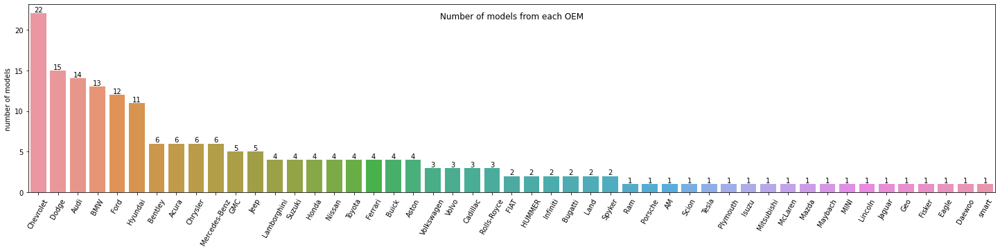

In [34]:
# Number of models from each OEM
plt.figure(figsize = (25,5))
ax = sns.barplot(x=carsMaster["OEM"].value_counts().index,y=carsMaster["OEM"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of models from each OEM",x=0.5,y=0.9)
plt.ylabel("number of models")
plt.xticks(rotation=60);

Distribution : Total number of OEMs - 49

The Chevrolet is having 11% of contribution for the various models

The Ram, Porsche, AM General, Jaguar, smart are few models that are contributing only 0.05% of the models

This help to understand about the imbalance of data for OEM and Models in the dataset

Number of Types available under each Model value

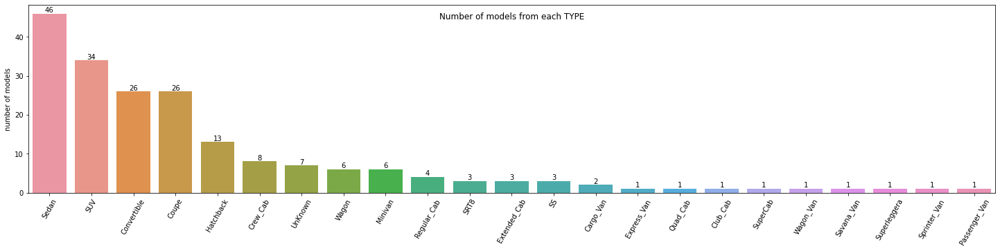

In [35]:
# Number of models from each TYPE of coach
plt.figure(figsize = (25,5))
ax = sns.barplot(x=carsMaster["TYPE"].value_counts().index,y=carsMaster["TYPE"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of models from each TYPE",x=0.5,y=0.9)
plt.ylabel("number of models")
plt.xticks(rotation=60);

Distribution : Total number of Sedan - 46

The Mitsubishi-Sedan is having 23% of contribution for the various models-types

The Club Cab, Wagon Van, Passenger Van are few models types that are contributing only 0.05% of the model-types

This help to understand about the imbalance of data for Model and Types in the dataset

Number of Models available under each Year

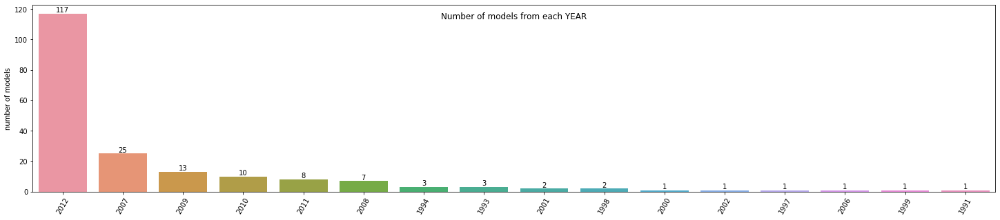

In [36]:
# Number of models from each YEAR
plt.figure(figsize = (25,5))
ax = sns.barplot(x=carsMaster["YEAR"].value_counts().index,y=carsMaster["YEAR"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of models from each YEAR",x=0.5,y=0.9)
plt.ylabel("number of models")
plt.xticks(rotation=60);

Distribution : Total number of Models in the year 2012 - 117

The 2012 is having 60% of contribution for the various models for the years

The models from 1991-2000 is having the least contribution of models counting to 0.05%

This help to understand about the imbalance of data for Models and Year in the dataset

Observations from the Visualization - Bias

There are imbalances in the dataset might create bias in the model's capabilities

Bias Type : Data Collection Bias

Description : Bias introduced by the selection of individuals, groups (eg; OEM, Model, Type, Year) in such a way that proper randomization is not achieved. This will fail to ensure that the sample obtained is representative of the population intended to be analyzed.

We could clearly understand that the contribution by few OEM , few Models and selected years are more than others. This will lead to the model being biased towards some OEM-Model-Year cars.

Eg; the model learns more of "Chevrolet" OEM than others. will learn "Sedan" Model than others and 2012 Year Model than others

To reconfirm the findings, let us also read the image data files in to our notebook, and review the distribution once again

Step 2: Map training and testing images to its classes.

Read Images for test and train

In [37]:
# reference paths
BASEfldr = 'car_data/car_data'
TRAINfldr = 'train/'
TESTfldr = 'test/'

In [38]:
# lets take a record of data about the training imagess
tfi = tf.keras.preprocessing.image
path = os.path.join(BASEfldr,TRAINfldr)
iCols = ["Image","ImagePath","folderName"]
imageMasterTrain = pd.DataFrame(columns=iCols)
imPath = np.empty(0)
fldrName = np.empty(0)
imageName = np.empty(0)
imH = np.empty(0)
imW = np.empty(0)
for cls in tqdm(carsMaster.fullNames,desc="imScanTrain"):
    # we can also do this with if os.isdir() check
    try:
        os.listdir(path+cls)
    except:
        print("path error: ",path+cls)
        continue
    for img in os.listdir(path+cls):
        imPath = np.append(imPath,np.array([path+cls+'/'+img]))
        fldrName = np.append(fldrName,np.array([cls]))
        imageName = np.append(imageName,np.array([img]))
        (w,h) = tfi.load_img(path+cls+'/'+img).size
        imH = np.append(imH,np.array([h]))
        imW = np.append(imW,np.array([w])) 
        
imageMasterTrain["Image"] = imageName
imageMasterTrain["ImagePath"] = imPath
imageMasterTrain["folderName"] = fldrName
imageMasterTrain["height"] = imH
imageMasterTrain["width"] = imW

imScanTrain: 100%|████████████████████████████| 196/196 [00:38<00:00,  5.09it/s]


In [39]:
# lets take a record of data about the testing imagess
path= os.path.join(BASEfldr,TESTfldr)
iCols = ["Image","ImagePath","folderName"]
imageMasterTest = pd.DataFrame(columns=iCols)
imPath = np.empty(0)
fldrName = np.empty(0)
imageName = np.empty(0)
imH = np.empty(0)
imW = np.empty(0)
for cls in tqdm(carsMaster.fullNames,desc="imScanTest"):
    # we can also do this with if os.isdir() check
    try:
        os.listdir(path+cls)
    except:
        print("path error: ",cls)
        continue
    for img in os.listdir(path+cls):
        imPath = np.append(imPath,np.array([path+cls+'/'+img]))
        fldrName = np.append(fldrName,np.array([cls]))
        imageName = np.append(imageName,np.array([img]))
        (w,h) = tfi.load_img(path+cls+'/'+img).size
        imH = np.append(imH,np.array([h]))
        imW = np.append(imW,np.array([w])) 
imageMasterTest["Image"] = imageName
imageMasterTest["ImagePath"] = imPath
imageMasterTest["folderName"] = fldrName
imageMasterTest["height"] = imH
imageMasterTest["width"] = imW

imScanTest: 100%|█████████████████████████████| 196/196 [00:39<00:00,  5.02it/s]


In [40]:
# update training image sizes
imageMasterTrain["pixels"] = imageMasterTrain.height * imageMasterTrain.width
# update testing image sizes
imageMasterTest["pixels"] = imageMasterTest.height * imageMasterTest.width

In [41]:
# This will help to visualize the dimensions of the images in range
print("largest image:"),display(imageMasterTrain.loc[imageMasterTrain.pixels.argmax()].to_frame().T)
print("tallest image:"),display(imageMasterTrain.loc[imageMasterTrain.height.argmax()].to_frame().T)
print("widest image:"),display(imageMasterTrain.loc[imageMasterTrain.width.argmax()].to_frame().T)
print("\n")
print("smallest image:"),display(imageMasterTrain.loc[imageMasterTrain.pixels.argmin()].to_frame().T)
print("shortest image:"),display(imageMasterTrain.loc[imageMasterTrain.height.argmin()].to_frame().T)
print("leanest image:"),display(imageMasterTrain.loc[imageMasterTrain.width.argmin()].to_frame().T);

largest image:


,Image,ImagePath,folderName,height,width,pixels
2561,05945.jpg,car_data/car_data/train/Chevrolet Sonic Sedan ...,Chevrolet Sonic Sedan 2012,3744.0,5616.0,21026304.0


tallest image:


,Image,ImagePath,folderName,height,width,pixels
2561,05945.jpg,car_data/car_data/train/Chevrolet Sonic Sedan ...,Chevrolet Sonic Sedan 2012,3744.0,5616.0,21026304.0


widest image:


,Image,ImagePath,folderName,height,width,pixels
2561,05945.jpg,car_data/car_data/train/Chevrolet Sonic Sedan ...,Chevrolet Sonic Sedan 2012,3744.0,5616.0,21026304.0




smallest image:


,Image,ImagePath,folderName,height,width,pixels
2297,00097.jpg,car_data/car_data/train/Chevrolet Corvette Ron...,Chevrolet Corvette Ron Fellows Edition Z06 2007,58.0,78.0,4524.0


shortest image:


,Image,ImagePath,folderName,height,width,pixels
5098,04047.jpg,car_data/car_data/train/Geo Metro Convertible ...,Geo Metro Convertible 1993,57.0,101.0,5757.0


leanest image:


,Image,ImagePath,folderName,height,width,pixels
2297,00097.jpg,car_data/car_data/train/Chevrolet Corvette Ron...,Chevrolet Corvette Ron Fellows Edition Z06 2007,58.0,78.0,4524.0


Resizing Images

Resizing images is a critical preprocessing step in computer vision. Machine Learning models  train faster on smaller images and they need images of same size as input.

Some of the Best Practices

1. To decide on what should be the size of the images, a good strategy is to employ 
progressive  resizing. eg; we can start with all images resized to the smallest one.

2. Progressive resizing will train an initial model with very small input images and gauge 
performance. We can use those weights as the starting point for the next model with larger 
input images.

3. Downsizing larger images to match the size of smaller images is often a better bet 
than increasing the size of small images to be larger.

4. In general, it is safer to maintain the raw image aspect ratio and resize 
proportionally.

5. Make use of image resizing methods like interpolation so that the resized images 
do not lose much of their perceptual character.

Image Interpolation

Image interpolation occurs when you resize or distort your image from one pixel grid to 
another. There are two types of interpolation. 

1. Adaptive : Adaptive methods change depending on what they are interpolating
2. Non-adaptive : Non-adaptive methods treat all pixels equally.

Higher-Order Interpolation techniques like Spline and Sinc are computationally costly, 
where as Nearest Neighbor, bilinear are computationally less expensive.

How to best resize the given images?

We can optimally learn representations of images for a given resolution by consistently 
improving the performance of the common vision models. We can use bilinear interpolation with learnable image resizing module using keras will help to acheive this

Ref: https://keras.io/examples/vision/learnable_resizer/
Initial Image Size

Based on above review, we shall restrict the image size fed to the network at 50x50 pixels, so as not to detoriate lower resolution images and thus affect model capabilities

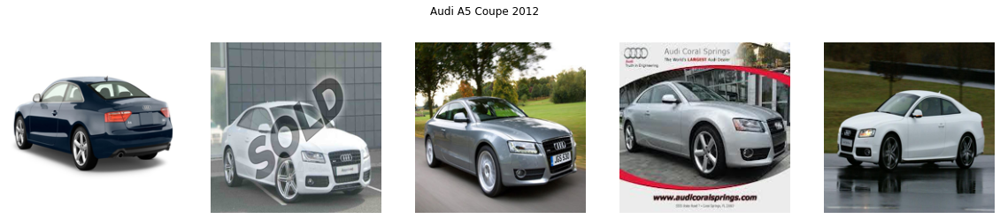

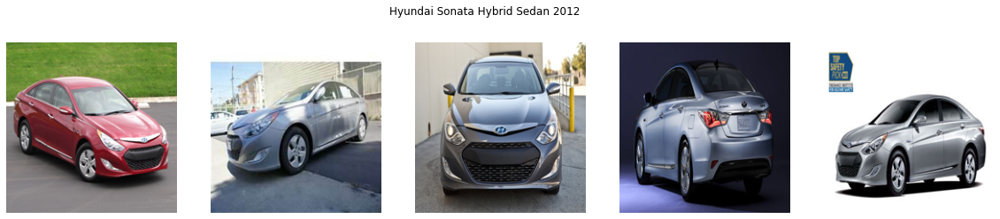

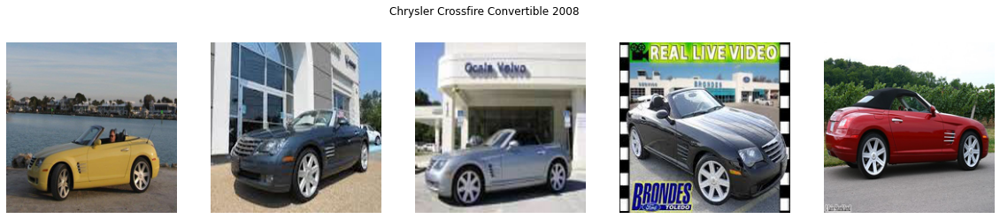

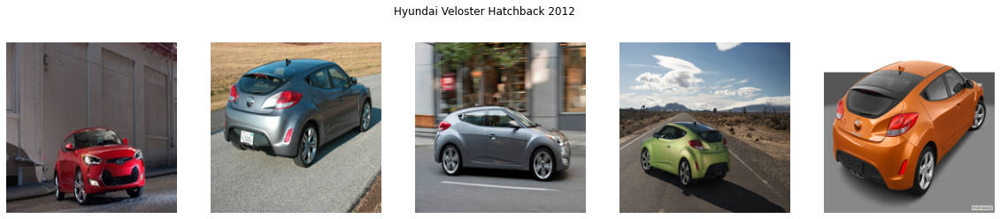

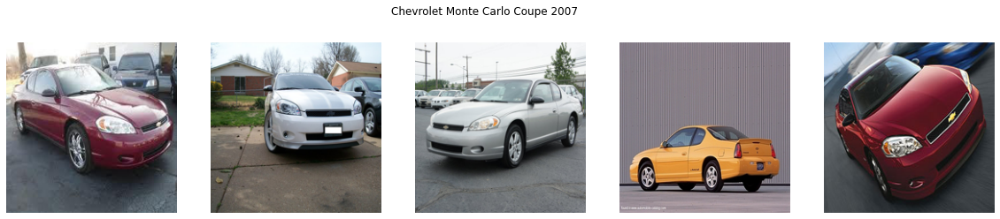

In [42]:
# display 5 random images of 5 random classes
classes = np.random.choice(imageMasterTrain.folderName.unique(),5,replace=False)
for cls in classes:
    dtmp = imageMasterTrain.loc[imageMasterTrain.folderName == cls]
    images = np.random.choice(dtmp.ImagePath.values,5,replace=False)
    plt.figure(figsize=(20,4))
    plt.suptitle(cls)
    for i,img in enumerate(images):
        img = Image.open(img).resize((200,200))
        plt.subplot(1,5,i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

Step 3: Map training and testing images to its annotations

Read Bounding box and annotations

Having connected to the images directories, lets also add the annotations, and add the bounding boxes to the images

In [43]:
# let us read the annotations datafile to pandas dataframe
trainAnnot = pd.read_csv('./Annotations/Train Annotations.csv')
testAnnot = pd.read_csv('./Annotations/Test Annotation.csv')
Acols = ['Image Name', 'x1', 'y1', 'x2','y2', 'Image class']
trainAnnot.columns = Acols
testAnnot.columns = Acols

In [44]:
#review the content
trainAnnot.head()

,Image Name,x1,y1,x2,y2,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106


In [45]:
# create all-consolidated dataframes
trainDF = pd.merge(imageMasterTrain,trainAnnot,how='outer',left_on='Image',right_on='Image Name')
testDF = pd.merge(imageMasterTest,testAnnot,how='outer',left_on='Image',right_on='Image Name')

In [46]:
# display samples
display(trainDF.head(),testDF.head())

,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class
0,00522.jpg,car_data/car_data/train/AM General Hummer SUV ...,AM General Hummer SUV 2000,71.0,94.0,6674.0,00522.jpg,6,7,94,68,1
1,03943.jpg,car_data/car_data/train/AM General Hummer SUV ...,AM General Hummer SUV 2000,480.0,640.0,307200.0,03943.jpg,50,127,587,396,1
2,01832.jpg,car_data/car_data/train/AM General Hummer SUV ...,AM General Hummer SUV 2000,100.0,160.0,16000.0,01832.jpg,29,18,157,86,1
3,01952.jpg,car_data/car_data/train/AM General Hummer SUV ...,AM General Hummer SUV 2000,375.0,500.0,187500.0,01952.jpg,11,31,490,266,1
4,02848.jpg,car_data/car_data/train/AM General Hummer SUV ...,AM General Hummer SUV 2000,480.0,640.0,307200.0,02848.jpg,51,73,570,426,1


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class
0,01199.jpg,car_data/car_data/test/AM General Hummer SUV 2...,AM General Hummer SUV 2000,187.0,249.0,46563.0,01199.jpg,17,23,240,135,1
1,01167.jpg,car_data/car_data/test/AM General Hummer SUV 2...,AM General Hummer SUV 2000,182.0,278.0,50596.0,01167.jpg,14,16,268,169,1
2,07258.jpg,car_data/car_data/test/AM General Hummer SUV 2...,AM General Hummer SUV 2000,120.0,160.0,19200.0,07258.jpg,2,13,160,120,1
3,01946.jpg,car_data/car_data/test/AM General Hummer SUV 2...,AM General Hummer SUV 2000,200.0,400.0,80000.0,01946.jpg,24,1,368,199,1
4,05275.jpg,car_data/car_data/test/AM General Hummer SUV 2...,AM General Hummer SUV 2000,263.0,400.0,105200.0,05275.jpg,40,60,354,237,1


In [47]:
# lets merge the OEM, MODEL, TYPE & YEAR data
trainDF = pd.merge(trainDF,carsMaster,how='outer',left_on='folderName',right_on='fullNames')
testDF = pd.merge(testDF,carsMaster,how='outer',left_on='folderName',right_on='fullNames')

In [48]:
# update class index to start from ZERO
trainDF["Image class"] = trainDF["Image class"]-1
testDF["Image class"] = testDF["Image class"]-1

In [49]:
# merge cars_names_and_make csv data with the annotation class name field
trainDF = pd.merge(trainDF,carsMaster,how='outer',left_on='Image class',right_index=True)
testDF = pd.merge(testDF,carsMaster,how='outer',left_on='Image class',right_index=True)
# though this will duplicate the already exisiting folderName, fullNames columns, this adds a cross check for data correctness

Validate data for any mismatch during merging

After doing the cross merged and synced with "Train/Test Annotations.csv", "Car names and make.csv" and the images in the "Train/Test images folders", it is found to have no mismatch of information

In [50]:
# review if any mismatches available
display(trainDF.loc[trainDF.folderName!=trainDF.fullNames_x])
display(trainDF.loc[trainDF.folderName!=trainDF.fullNames_y])
display(trainDF.loc[trainDF.fullNames_x!=trainDF.fullNames_y])
display(testDF.loc[testDF.folderName!=testDF.fullNames_x])
display(testDF.loc[testDF.folderName!=testDF.fullNames_y])
display(testDF.loc[testDF.fullNames_x!=testDF.fullNames_y])

,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


,Image,ImagePath,folderName,height,width,pixels,Image Name,x1,y1,x2,y2,Image class,fullNames_x,OEM_x,MODEL_x,TYPE_x,YEAR_x,fullNames_y,OEM_y,MODEL_y,TYPE_y,YEAR_y


In [51]:
# finalize the images dataframe
trainDF = trainDF[["ImagePath",'x1','y1','x2','y2',"height","width","folderName","OEM_x","MODEL_x","TYPE_x","YEAR_x",]]
testDF = testDF[["ImagePath",'x1','y1','x2','y2',"height","width","folderName","OEM_x","MODEL_x","TYPE_x","YEAR_x",]]

trainDF.columns = ["ImagePath",'x1','y1','x2','y2',"height","width","className","OEM","MODEL","TYPE","YEAR"]
testDF.columns = ["ImagePath",'x1','y1','x2','y2',"height","width","className","OEM","MODEL","TYPE","YEAR"]

In [52]:
trainDF.sample(10)

,ImagePath,x1,y1,x2,y2,height,width,className,OEM,MODEL,TYPE,YEAR
3863,car_data/car_data/train/Dodge Durango SUV 2012...,226,1,668,376,400.0,869.0,Dodge Durango SUV 2012,Dodge,Durango,SUV,2012
4629,car_data/car_data/train/Ford F-150 Regular Cab...,55,355,1333,1135,1200.0,1600.0,Ford F-150 Regular Cab 2012,Ford,F-150,Regular_Cab,2012
7088,car_data/car_data/train/Nissan 240SX Coupe 199...,30,15,639,419,480.0,640.0,Nissan 240SX Coupe 1998,Nissan,240SX,Coupe,1998
3054,car_data/car_data/train/Chevrolet Silverado 15...,13,153,626,391,480.0,640.0,Chevrolet Silverado 1500 Regular Cab 2012,Chevrolet,Silverado_1500,Regular_Cab,2012
3198,car_data/car_data/train/Chrysler 300 SRT-8 201...,70,222,957,519,768.0,1024.0,Chrysler 300 SRT-8 2010,Chrysler,300_SRT-8,SRT8,2010
2564,car_data/car_data/train/Chevrolet Sonic Sedan ...,70,502,977,951,1067.0,1600.0,Chevrolet Sonic Sedan 2012,Chevrolet,Sonic,Sedan,2012
7939,car_data/car_data/train/Volkswagen Beetle Hatc...,147,178,951,633,768.0,1024.0,Volkswagen Beetle Hatchback 2012,Volkswagen,Beetle,Hatchback,2012
187,car_data/car_data/train/Acura TSX Sedan 2012/0...,68,48,235,162,187.0,300.0,Acura TSX Sedan 2012,Acura,TSX,Sedan,2012
2039,car_data/car_data/train/Cadillac CTS-V Sedan 2...,13,23,244,160,170.0,256.0,Cadillac CTS-V Sedan 2012,Cadillac,CTS-V,Sedan,2012
1116,car_data/car_data/train/BMW 1 Series Coupe 201...,24,83,426,218,254.0,450.0,BMW 1 Series Coupe 2012,BMW,1_Series,Coupe,2012


In [53]:
# review for any missing values
trainDF.isna().sum()

ImagePath    0
x1           0
y1           0
x2           0
y2           0
height       0
width        0
className    0
OEM          0
MODEL        0
TYPE         0
YEAR         0
dtype: int64

In [54]:
testDF.isna().sum()

ImagePath    0
x1           0
y1           0
x2           0
y2           0
height       0
width        0
className    0
OEM          0
MODEL        0
TYPE         0
YEAR         0
dtype: int64

Step 4: Display images with bounding box

Visualization - Images with bounding box and annotations - 5 Nos

2023-05-06 12:46:51.782726: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


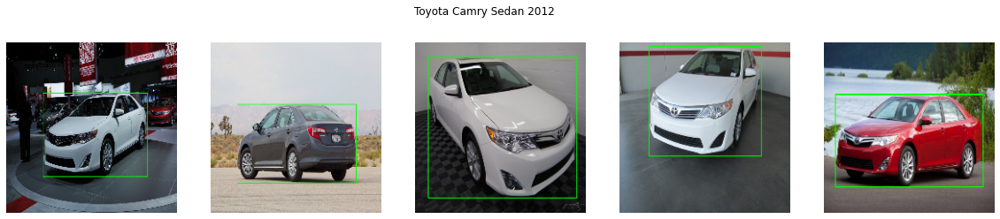

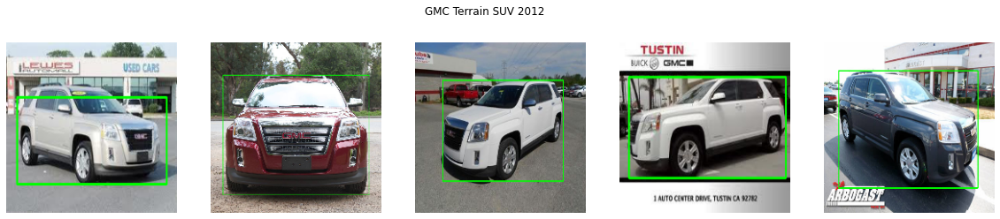

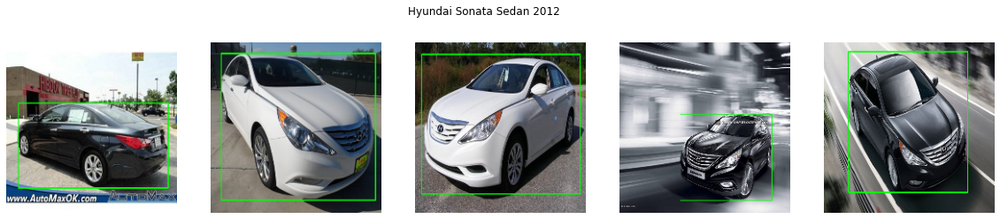

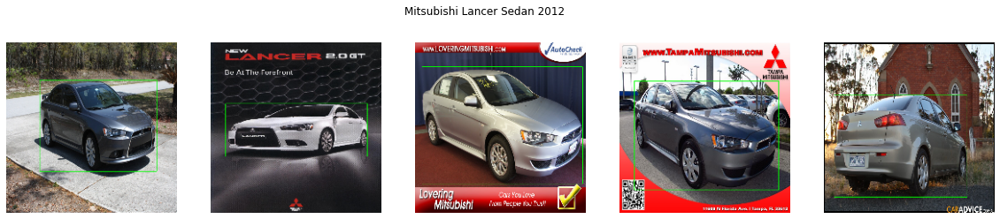

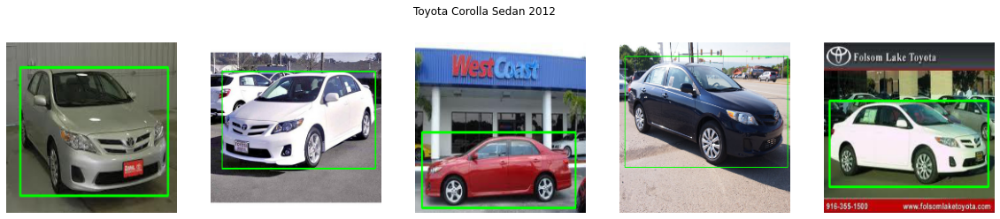

In [55]:
# display 5 random images of 5 random classes with respective bounding boxes from the annotations csv
classes = np.random.choice(trainDF.className.unique(),5,replace=False)
tfi = tf.keras.preprocessing.image
for cls in classes:
    dtmp = trainDF.loc[trainDF.className == cls]
    ind = np.random.choice(dtmp.index,5,replace=False)
    images = dtmp.loc[ind]["ImagePath"]
    x1 = dtmp.loc[ind]["x1"].values
    y1 = dtmp.loc[ind]["y1"].values
    x2 = dtmp.loc[ind]["x2"].values
    y2 = dtmp.loc[ind]["y2"].values

    plt.figure(figsize=(20,4))
    plt.suptitle(cls)
    for i,img in enumerate(images):
        img = tfi.img_to_array(tfi.load_img(img))
        cv2.rectangle(img,(x1[i],y1[i]),(x2[i],y2[i]),(0,255,0),2)
        img = tfi.array_to_img(tf.image.resize(img,(200,200)))
        plt.subplot(1,5,i+1)
        plt.imshow(img)
        plt.axis('off')
    plt.show()

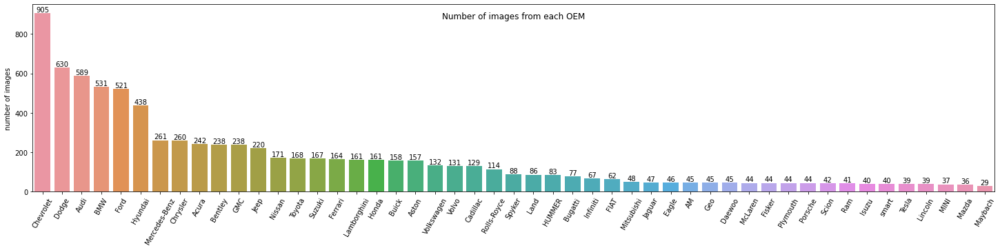

In [56]:
# Number of images from each OEM
plt.figure(figsize = (25,5))
ax = sns.barplot(x=trainDF["OEM"].value_counts().index,y=trainDF["OEM"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of images from each OEM",x=0.5,y=0.9)
plt.ylabel("number of images")
plt.xticks(rotation=60);

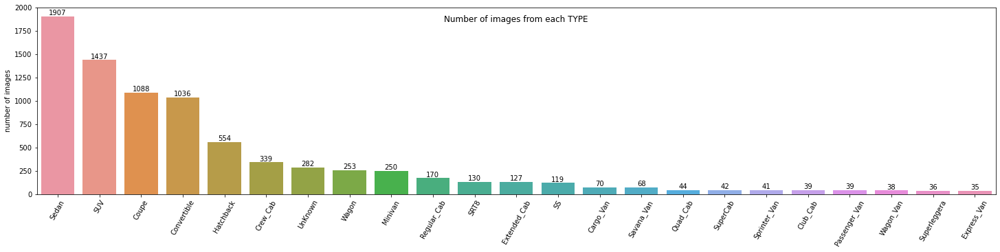

In [58]:
# Number of images from each TYPE
plt.figure(figsize = (25,5))
ax = sns.barplot(x=trainDF["TYPE"].value_counts().index,y=trainDF["TYPE"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of images from each TYPE",x=0.5,y=0.9)
plt.ylabel("number of images")
plt.xticks(rotation=60);

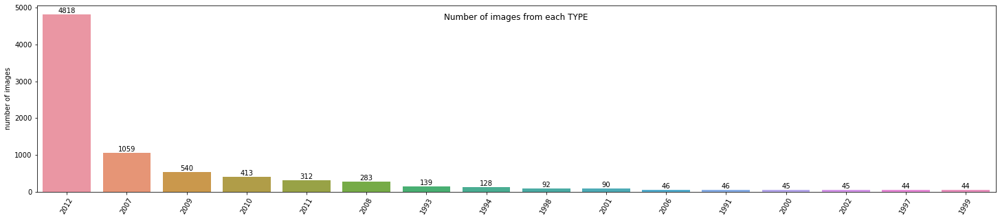

In [59]:
# Number of images from each YEAR
plt.figure(figsize = (25,5))
ax = sns.barplot(x=trainDF["YEAR"].value_counts().index,y=trainDF["YEAR"].value_counts().values) # display bars
ax.bar_label(ax.containers[0]) # display counts
plt.title("Number of images from each TYPE",x=0.5,y=0.9)
plt.ylabel("number of images")
plt.xticks(rotation=60);

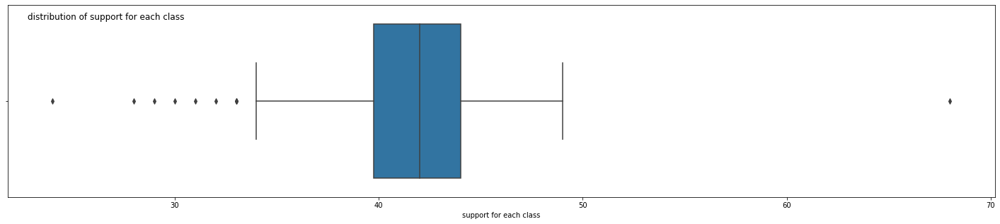

In [60]:
# distribution of support for each class
plt.figure(figsize = (25,5))
sns.boxplot(x=trainDF["className"].value_counts())
plt.xlabel("support for each class")
plt.title("distribution of support for each class",x=0.1,y=0.9);

In [61]:
# let us study the cross distribution of the TYPE of car from each OEM
pivot = trainDF.groupby(by=["OEM","TYPE","YEAR"])["className"].count().to_frame()
pivot.reset_index(inplace=True)
pivot.columns=["OEM","TYPE","YEAR","COUNTS"]
pivot

,OEM,TYPE,YEAR,COUNTS
0,AM,SUV,2000,45
1,Acura,Hatchback,2012,39
2,Acura,Sedan,2012,116
3,Acura,UnKnown,2001,45
4,Acura,UnKnown,2008,42
...,...,...,...,...
145,Volkswagen,Hatchback,2012,86
146,Volvo,Hatchback,2012,42
147,Volvo,SUV,2007,43
148,Volvo,Sedan,1993,46


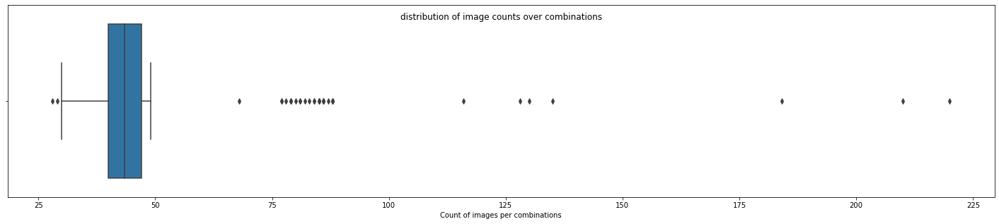

In [62]:
# distribution of support for each class
plt.figure(figsize = (25,5))
sns.boxplot(x=pivot.COUNTS)
plt.xlabel("Count of images per combinations")
plt.title("distribution of image counts over combinations",x=0.5,y=0.9);

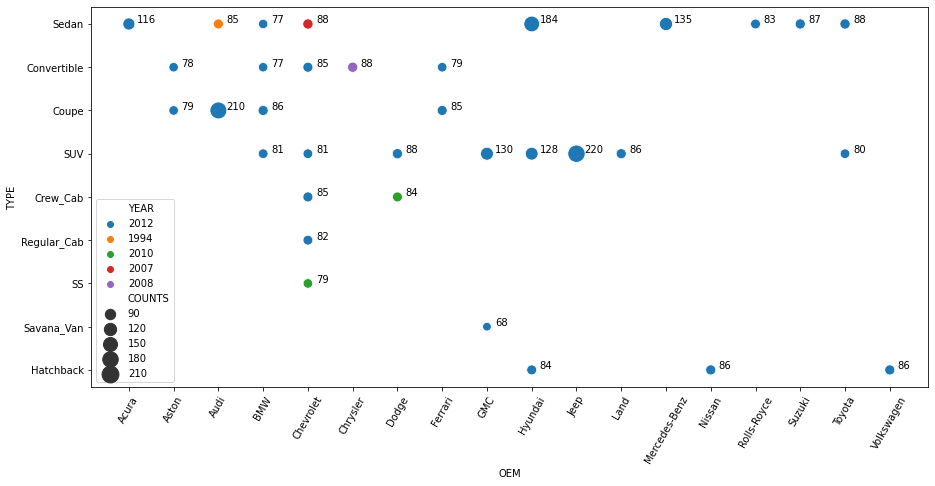

In [63]:
# combinations with more than 50 images each
graphDF = pivot.loc[pivot.COUNTS>50]
plt.figure(figsize=(15,7))
ax = sns.scatterplot(x=graphDF.OEM,y=graphDF.TYPE,hue=graphDF.YEAR,size=graphDF.COUNTS,sizes=(75,300))
plt.xticks(rotation=60)
plt.legend(loc='lower left')

for i in range(len(graphDF)):
    xpos = (np.argwhere(graphDF.OEM.unique()==graphDF.OEM.values[i])[0][0])# / graphDF.OEM.nunique()
    ypos = (np.argwhere(graphDF.TYPE.unique()==graphDF.TYPE.values[i])[0][0])# / graphDF.TYPE.nunique()
    ax.annotate(text=str(graphDF.COUNTS.values[i]), xy=(xpos,ypos), xycoords='data', 
                xytext=(8,1), textcoords='offset points')

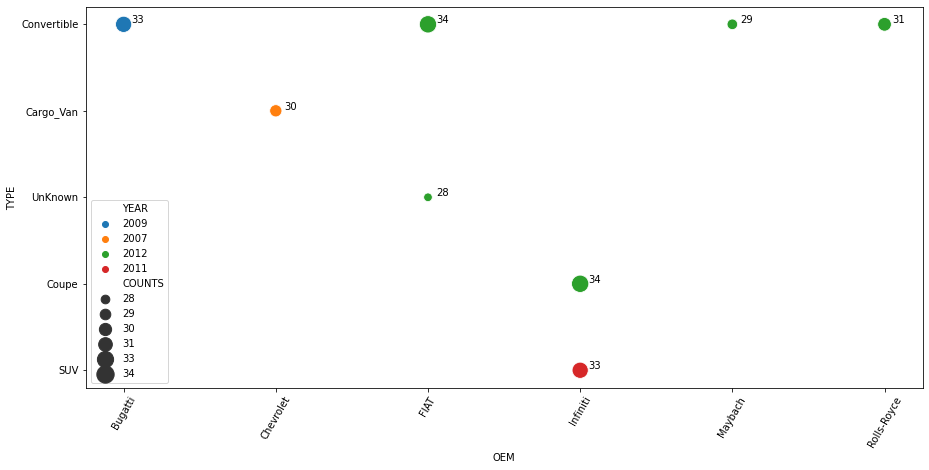

In [64]:
# combinations with less than 35 images each
graphDF = pivot.loc[pivot.COUNTS<35]
plt.figure(figsize=(15,7))
ax = sns.scatterplot(x=graphDF.OEM,y=graphDF.TYPE,hue=graphDF.YEAR,size=graphDF.COUNTS,sizes=(75,300))
plt.xticks(rotation=60)
plt.legend(loc='lower left')

for i in range(len(graphDF)):
    xpos = (np.argwhere(graphDF.OEM.unique()==graphDF.OEM.values[i])[0][0])# / graphDF.OEM.nunique()
    ypos = (np.argwhere(graphDF.TYPE.unique()==graphDF.TYPE.values[i])[0][0])# / graphDF.TYPE.nunique()
    ax.annotate(text=str(graphDF.COUNTS.values[i]), xy=(xpos,ypos), xycoords='data', 
                xytext=(8,1), textcoords='offset points')

### Import necessary libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from skimage.transform import resize
from skimage.io import imread
import random
from os import path
import cv2
import random

### Set data path

In [2]:
DATA_SET_PATH = "/Users/j/CAPSTONE-PROJECT/Car-Dataset/"
ANNOTATION_PATH = "Annotations/"
TRAIN_IMAGES_DIR_PATH = "Car-Images/Train/"
TEST_IMAGES_DIR_PATH = "Car-Images/Test/"

In [3]:
"""
DATA_SET_PATH = "/Users/j/CAPSTONE-PROJECT/Car-Dataset/"
ANNOTATION_PATH = DATA_SET_PATH + "Annotations/"
TRAIN_IMAGES_DIR_PATH = DATA_SET_PATH + "Car-Images/Train/"
TEST_IMAGES_DIR_PATH = DATA_SET_PATH + "Car-Images/Test/"
"""

'\nDATA_SET_PATH = "/Users/j/CAPSTONE-PROJECT/Car-Dataset/"\nANNOTATION_PATH = DATA_SET_PATH + "Annotations/"\nTRAIN_IMAGES_DIR_PATH = DATA_SET_PATH + "Car-Images/Train/"\nTEST_IMAGES_DIR_PATH = DATA_SET_PATH + "Car-Images/Test/"\n'

### Load Car names and make data

In [4]:
car_makes_df = pd.read_csv("/Users/j/CAPSTONE-PROJECT/Car-Dataset/Car-names.csv", header=None, names=["car_make"]) 

In [5]:
car_makes_df

,car_make
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012
...,...
191,Volkswagen Beetle Hatchback 2012
192,Volvo C30 Hatchback 2012
193,Volvo 240 Sedan 1993
194,Volvo XC90 SUV 2007


In [6]:
car_makes_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 196 entries, 0 to 195
Data columns (total 1 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   car_make  196 non-null    object
dtypes: object(1)
memory usage: 1.7+ KB


### Load Annotations Data

In [7]:
car_annotations_train = pd.read_csv("/Users/j/CAPSTONE-PROJECT/Car-Dataset/Annotations/Train Annotations.csv")
car_annotations_test = pd.read_csv("/Users/j/CAPSTONE-PROJECT/Car-Dataset/Annotations/Test Annotation.csv")

In [8]:
car_annotations_train

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,39,116,569,375,14
1,00002.jpg,36,116,868,587,3
2,00003.jpg,85,109,601,381,91
3,00004.jpg,621,393,1484,1096,134
4,00005.jpg,14,36,133,99,106
...,...,...,...,...,...,...
8139,08140.jpg,3,44,423,336,78
8140,08141.jpg,138,150,706,523,196
8141,08142.jpg,26,246,660,449,163
8142,08143.jpg,78,526,1489,908,112


In [9]:
car_annotations_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8144 entries, 0 to 8143
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Image Name                8144 non-null   object
 1   Bounding Box coordinates  8144 non-null   int64 
 2   Unnamed: 2                8144 non-null   int64 
 3   Unnamed: 3                8144 non-null   int64 
 4   Unnamed: 4                8144 non-null   int64 
 5   Image class               8144 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 381.9+ KB


In [10]:
car_annotations_test

,Image Name,Bounding Box coordinates,Unnamed: 2,Unnamed: 3,Unnamed: 4,Image class
0,00001.jpg,30,52,246,147,181
1,00002.jpg,100,19,576,203,103
2,00003.jpg,51,105,968,659,145
3,00004.jpg,67,84,581,407,187
4,00005.jpg,140,151,593,339,185
...,...,...,...,...,...,...
8036,08037.jpg,49,57,1169,669,63
8037,08038.jpg,23,18,640,459,16
8038,08039.jpg,33,27,602,252,17
8039,08040.jpg,33,142,521,376,38


In [11]:
car_annotations_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8041 entries, 0 to 8040
Data columns (total 6 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   Image Name                8041 non-null   object
 1   Bounding Box coordinates  8041 non-null   int64 
 2   Unnamed: 2                8041 non-null   int64 
 3   Unnamed: 3                8041 non-null   int64 
 4   Unnamed: 4                8041 non-null   int64 
 5   Image class               8041 non-null   int64 
dtypes: int64(5), object(1)
memory usage: 377.0+ KB


### car_annotations_test data has 6 features with no null/missing value.
### Bounding Box coordinates, Unnamed: 2, Unnamed: 3, Unnamed: 4 are x1, y1, x2, y2 coordinates respectively

### Display images class and respective number of images
##### Use pd.option_context to display maximum rows

In [12]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
  print(pd.DataFrame(car_annotations_train['Image class']).value_counts())

Image class
119            68
79             49
161            48
167            48
144            47
56             47
98             46
171            46
162            46
191            46
20             46
182            46
95             46
43             46
112            46
194            46
153            45
147            45
44             45
179            45
53             45
123            45
59             45
121            45
65             45
73             45
72             45
148            45
115            45
114            45
81             45
82             45
109            45
107            45
1              45
165            45
6              45
8              45
34             45
24             45
187            44
160            44
188            44
164            44
74             44
75             44
76             44
85             44
89             44
16             44
94             44
170            44
151            44
105            44
108            4

#### Image class - 119 has maximum 68 images and Image class - 136 has minimum 24 images

#### Visualize train images and test images datasets

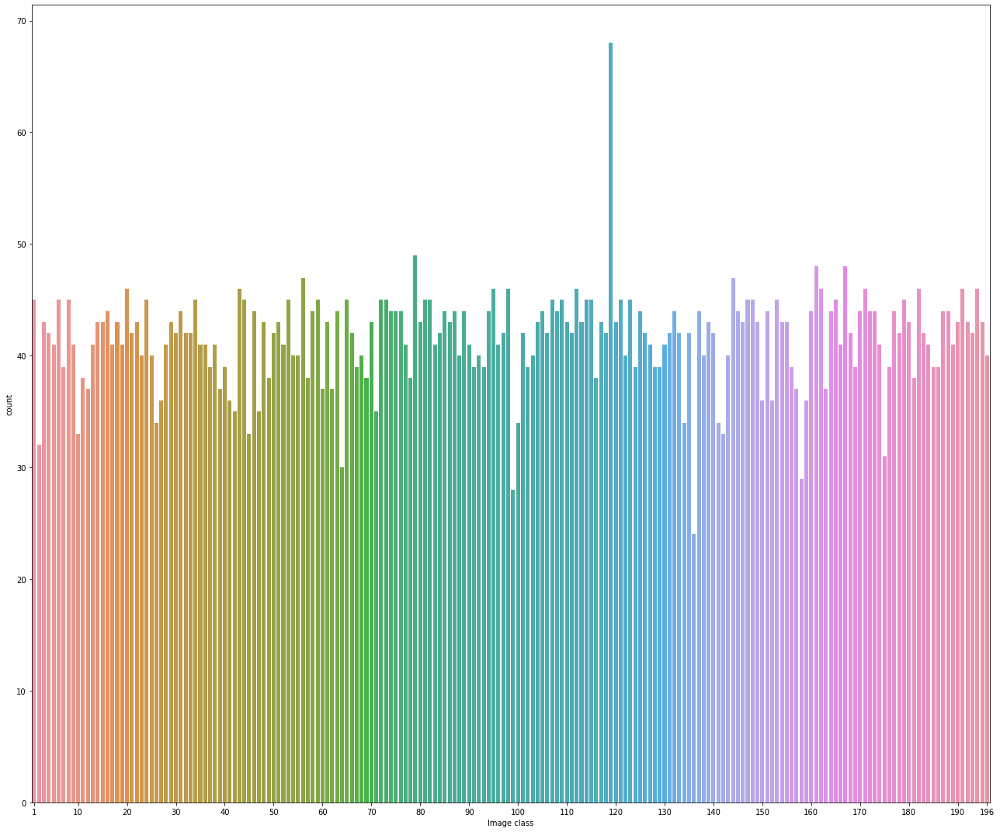

In [13]:
#%matplotlib inline
plt.subplots(figsize=(18,15))
ax = sns.countplot(data = car_annotations_train, x = car_annotations_train['Image class'] )
ax.set_xticks([0, 9,19,29,39,49,59,69,79,89,99,109,119,129,139,149,159,169,179,189,195] )
ax.set_xticklabels([1, 10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,196])
plt.tight_layout()
plt.show()

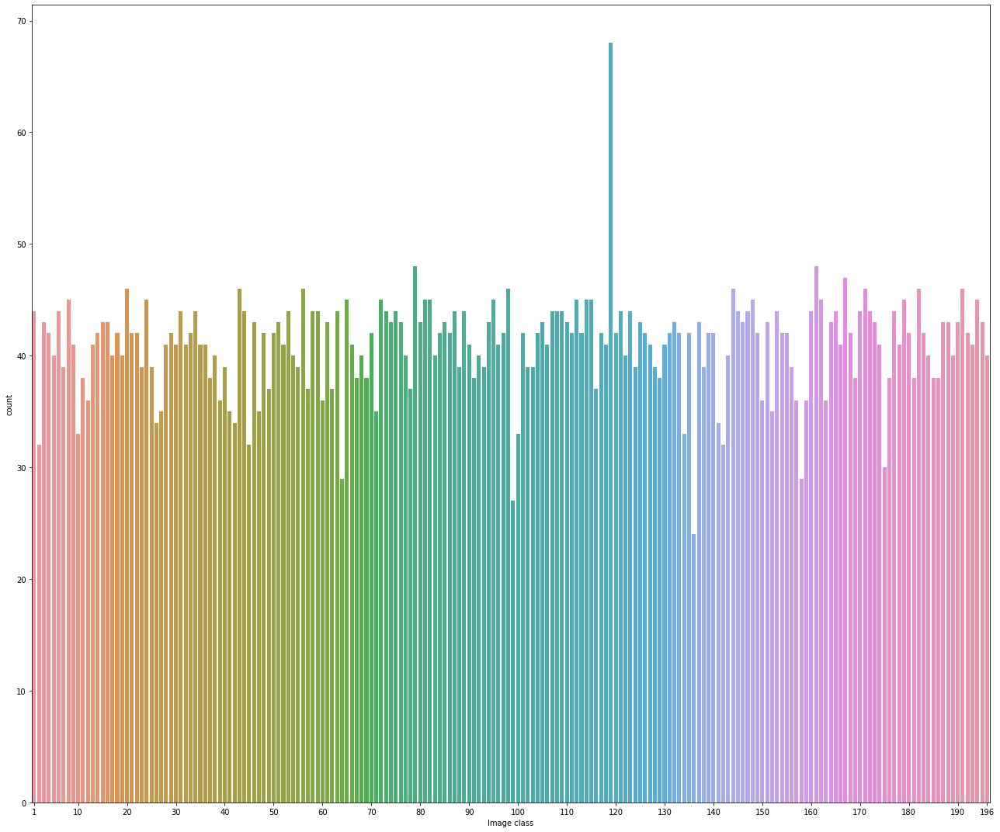

In [14]:
plt.subplots(figsize=(18,15))
ax = sns.countplot(data = car_annotations_test, x = car_annotations_test['Image class'] )
ax.set_xticks([0, 9,19,29,39,49,59,69,79,89,99,109,119,129,139,149,159,169,179,189,195] )
ax.set_xticklabels([1, 10,20,30,40,50,60,70,80,90,100,110,120,130,140,150,160,170,180,190,196])
plt.tight_layout()
plt.show()

#### In Test Images, Image class - 119 has maximum images and Image class - 136 has minimum images

 ####  Step 2: Map training and testing images to its classes.

#### Custom function to create dataframe that contains Image Name, Full path of the image and Image class

In [15]:
def load_image_paths_and_map_class(car_makes, dir_path, df_annotations):
  data = []
  for car_make in car_makes:
    img_path =  dir_path + car_make
    if os.path.exists(img_path):
      for img in os.listdir(img_path):
        data.append([img, img_path + "/" +img, df_annotations[df_annotations["Image Name"]==img]["Image class"].values[0]])
  return pd.DataFrame(data, columns=["Image Name", "FullPath", "Image Class"])

In [16]:
train_images_path = load_image_paths_and_map_class(car_makes_df.car_make.values, TRAIN_IMAGES_DIR_PATH, car_annotations_train)
test_images_path = load_image_paths_and_map_class(car_makes_df.car_make.values, TEST_IMAGES_DIR_PATH, car_annotations_test)

#### Image Name, Image path and Image class are stored in train_images_path and test_images_path

In [17]:
print("Total Training Images:", len(train_images_path))
print("Total Testing Images:", len(test_images_path))

Total Training Images: 8103
Total Testing Images: 8000


#### Display train_images_path dataframe

In [18]:
train_images_path.head()

,Image Name,FullPath,Image Class
0,00522.jpg,Car-Images/Train/AM General Hummer SUV 2000/00...,1
1,03943.jpg,Car-Images/Train/AM General Hummer SUV 2000/03...,1
2,01832.jpg,Car-Images/Train/AM General Hummer SUV 2000/01...,1
3,01952.jpg,Car-Images/Train/AM General Hummer SUV 2000/01...,1
4,02848.jpg,Car-Images/Train/AM General Hummer SUV 2000/02...,1


In [19]:
print("Image path:", train_images_path.iloc[0,1])
print("Image shape:", cv2.imread(train_images_path.iloc[0,1]).shape)

Image path: Car-Images/Train/AM General Hummer SUV 2000/00522.jpg
Image shape: (71, 94, 3)


#### Custom function to display random images along with respective class

In [20]:
def plot_random_cars(car_makes, images_path, is_export=False):
  export_paths = {}
  for car_make_idx in range(5):
      imageClass = random.randrange(0, len(car_makes_df))
      print(car_makes.iloc[imageClass].values[0])
      plt.figure(figsize=(15,12))
      for i in range(5):
        df = images_path[images_path["Image Class"]==imageClass]
        if len(df) > 0:
          idx = random.randrange(0, len(df))
          plt.subplot(5, 5, i+1)
          plt.xticks([])
          plt.yticks([])
          plt.grid(False)
          plt.imshow(imread(df.iloc[idx].FullPath))
      if is_export:
        p = str(imageClass) + "_class.png"
        plt.savefig(p)
        export_paths[car_makes.iloc[imageClass].values[0]] = p
      plt.show()
  return export_paths

In [21]:
car_makes_df.head()

,car_make
0,AM General Hummer SUV 2000
1,Acura RL Sedan 2012
2,Acura TL Sedan 2012
3,Acura TL Type-S 2008
4,Acura TSX Sedan 2012


#### Display train images along with its class

Toyota Camry Sedan 2012


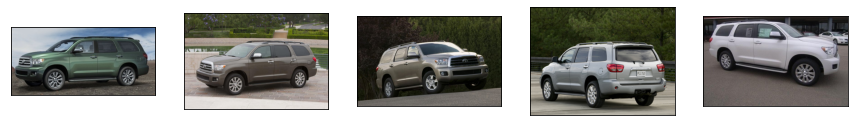

Dodge Durango SUV 2012


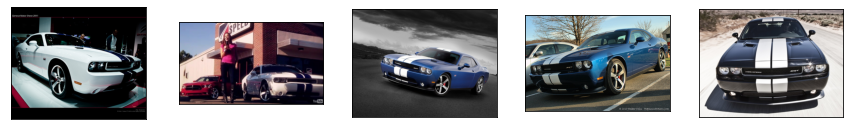

Toyota Corolla Sedan 2012


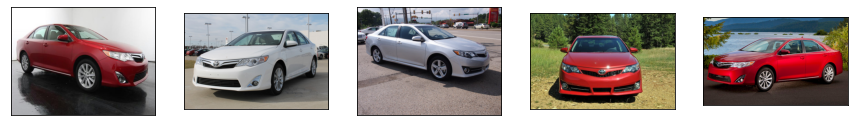

Ford Mustang Convertible 2007


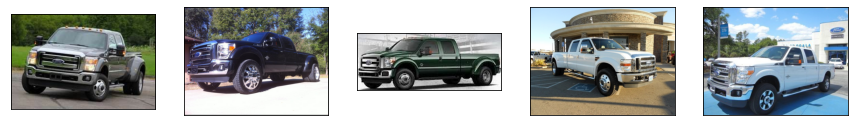

BMW 3 Series Wagon 2012


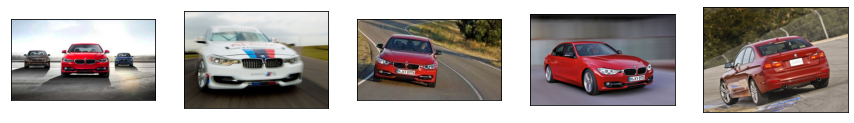

{}

In [22]:
plot_random_cars(car_makes_df, train_images_path)

#### Display Test images along with its class

Suzuki SX4 Sedan 2012


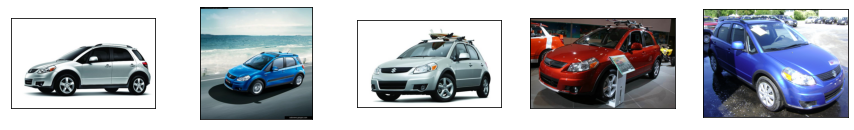

Plymouth Neon Coupe 1999


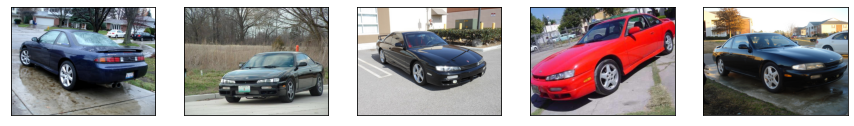

BMW 3 Series Sedan 2012


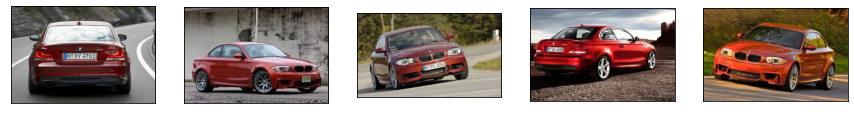

Chrysler Sebring Convertible 2010


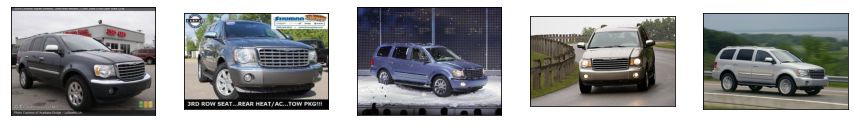

Mercedes-Benz E-Class Sedan 2012


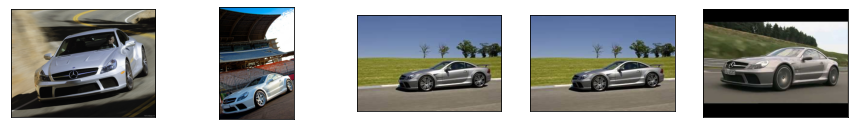

{}

In [23]:
plot_random_cars(car_makes_df, test_images_path)

####  Image Augmentation using Img_Aug library

In [24]:
import imageio
import imgaug as ia
import imgaug.augmenters as iaa
import glob

#### Augment training images

In [25]:
augmented_img = []
labels = []

for imgfolder in os.listdir(TRAIN_IMAGES_DIR_PATH):
  imgpath = TRAIN_IMAGES_DIR_PATH + imgfolder
  for img in glob.glob(imgpath + '/' + '*.jpg'):
    image = imageio.imread(img, pilmode="RGB")
    resize_image = iaa.Resize(224)
    image = resize_image.augment_image(image)
    augmented_img.append(image) ### image resized to 224 and appended ## actual image 
    labels.append(imgfolder) ### label appended
    
    #rotation 10
    rotate=iaa.Affine(rotate=(10))
    rotated_image=rotate.augment_image(image)
    augmented_img.append(rotated_image)
    labels.append(imgfolder)

    #rotation 20
    rotate=iaa.Affine(rotate=(20))
    rotated_image=rotate.augment_image(image)
    augmented_img.append(rotated_image)
    labels.append(imgfolder)

    #rotation 40
#     rotate=iaa.Affine(rotate=(40))
#     rotated_image=rotate.augment_image(image)
#     augmented_img.append(rotated_image)
#     labels.append(imgfolder)
    
    #Add gaussian_noise
    gaussian_noise=iaa.AdditiveGaussianNoise(10,20)
    noise_image=gaussian_noise.augment_image(image)
    augmented_img.append(noise_image)
    labels.append(imgfolder)

    gaussian_noise=iaa.AdditiveGaussianNoise(20,30)
    noise_image=gaussian_noise.augment_image(image)
    augmented_img.append(noise_image)
    labels.append(imgfolder)

#     gaussian_noise=iaa.AdditiveGaussianNoise(30,40)
#     noise_image=gaussian_noise.augment_image(image)
#     augmented_img.append(noise_image)
#     labels.append(imgfolder)
    
    #Crop images
    crop = iaa.Crop(percent=(0.1)) # crop image
    crop_image=crop.augment_image(image)
    augmented_img.append(crop_image)
    labels.append(imgfolder)

    #shear
    shear = iaa.Affine(shear=(20,30))
    shear_image=shear.augment_image(image)
    augmented_img.append(shear_image)
    labels.append(imgfolder)

    shear = iaa.Affine(shear=(0,10))
    shear_image=shear.augment_image(image)
    augmented_img.append(shear_image)
    labels.append(imgfolder)

    shear = iaa.Affine(shear=(10,20))
    shear_image=shear.augment_image(image)
    augmented_img.append(shear_image)
    labels.append(imgfolder)

    #flip_hr=iaa.Flipud(p=1.0)
    #flip_hr_image= flip_hr.augment_image(image)
    #augmented_img.append(flip_hr_image)
    #labels.append(imgfolder)
    
    #Contrast
    contrast=iaa.GammaContrast(gamma=2.0)
    contrast_image =contrast.augment_image(image)
    augmented_img.append(contrast_image)
    labels.append(imgfolder)

    #Scale images
    scale_im=iaa.Affine(scale={"x": (1.5, 1.0), "y": (1.5, 1.0)})
    scale_image =scale_im.augment_image(image)
    augmented_img.append(scale_image)
    labels.append(imgfolder)

/var/folders/b6/ryf5z7sj707bhc_8q_jkk7q00000gn/T/ipykernel_33140/978375278.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(img, pilmode="RGB")


#### Test images resized to 224, No augmentation

In [26]:
augmented_img_test = []
labels_test = []

for imgfolder in os.listdir(TEST_IMAGES_DIR_PATH):
  imgpath = TEST_IMAGES_DIR_PATH + imgfolder
  for img in glob.glob(imgpath + '/' + '*.jpg'):
    image = imageio.imread(img,pilmode="RGB")
    resize_image = iaa.Resize(224)
    image = resize_image.augment_image(image)
    augmented_img_test.append(image)
    labels_test.append(imgfolder)

/var/folders/b6/ryf5z7sj707bhc_8q_jkk7q00000gn/T/ipykernel_33140/3694155021.py:7: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning dissapear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(img,pilmode="RGB")


In [27]:
## Convert to numpy array

augmented_img_test = np.array(augmented_img_test)
labels_test = np.array(labels_test)

augmented_img = np.array(augmented_img)
labels = np.array(labels)

In [28]:
## Apply label encoder on labels
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

le.fit(labels)
labels_enc = le.transform(labels)

le = LabelEncoder()

le.fit(labels_test)
labels_test_enc = le.transform(labels_test)

#### Check shape and length of augmented images

In [29]:
augmented_img[0].shape,augmented_img[24].shape, np.array(augmented_img).shape, len(labels)

((224, 224, 3), (224, 224, 3), (89584, 224, 224, 3), 89584)

#### Display augmented images

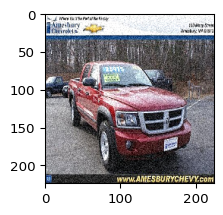

In [30]:
ia.imshow(augmented_img[3])

In [31]:
pd.DataFrame(labels_enc).value_counts()

119    748
75     539
160    528
166    528
143    517
      ... 
175    341
59     330
157    319
98     308
129    264
Length: 196, dtype: int64

In [32]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout

#### Map training and testing images to its annotations.

#### Custom function to map images to its annotations

In [33]:
def plot_random_cars_with_bounding_box(car_makes, images_path, annotations, is_export=False):
  export_paths = {}
  for car_make_idx in range(5):
      imageClass = random.randrange(0, len(car_makes_df))
      print(car_makes.iloc[imageClass].values[0])
      plt.figure(figsize=(15,12))
      for i in range(3):
        df = images_path[images_path["Image Class"]==imageClass]
        if len(df) > 0:
          idx = random.randrange(0, len(df))
          plt.subplot(3, 3, i+1)
          plt.xticks([])
          plt.yticks([])
          plt.grid(False)
          img = imread(df.iloc[idx].FullPath)
          ann = annotations[annotations["Image Name"] == df.iloc[idx]["Image Name"]]
          x1,y1,x2,y2 = ann['Bounding Box coordinates'].values[0], ann['Unnamed: 2'].values[0], ann['Unnamed: 3'].values[0], ann['Unnamed: 4'].values[0]
          cv2.rectangle(img,(x1,y1),(x2,y2),(0,255,0),2) # add rectangle to image
          plt.imshow(img)
      if is_export:
        p = str(imageClass) + "_bb.png"
        plt.savefig(p)
        export_paths[car_makes.iloc[imageClass].values[0]] = p
      plt.show()
  return export_paths

#### Display images with bounding box
#### Draw bounding box on Train Images

GMC Yukon Hybrid SUV 2012


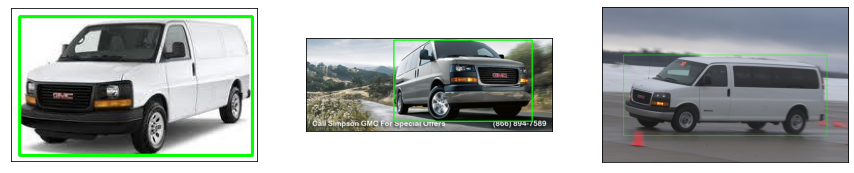

BMW Z4 Convertible 2012


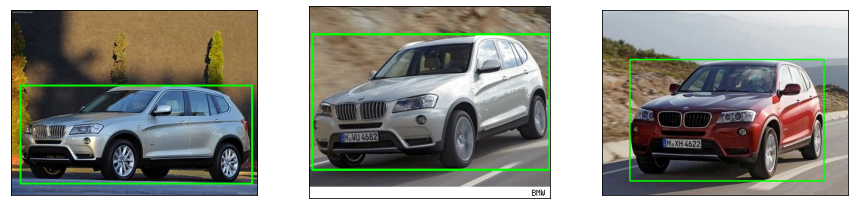

Dodge Journey SUV 2012


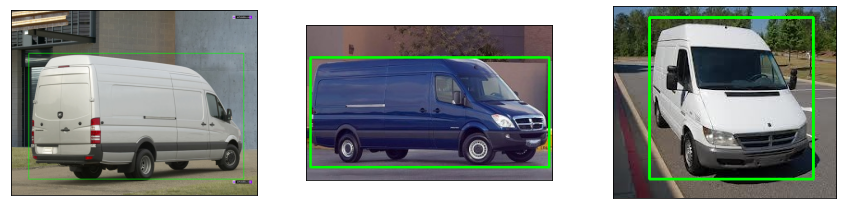

Cadillac CTS-V Sedan 2012


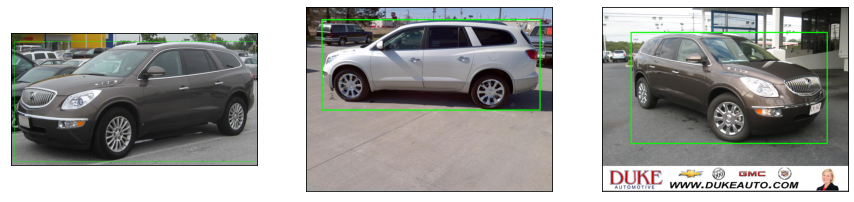

Ford Focus Sedan 2007


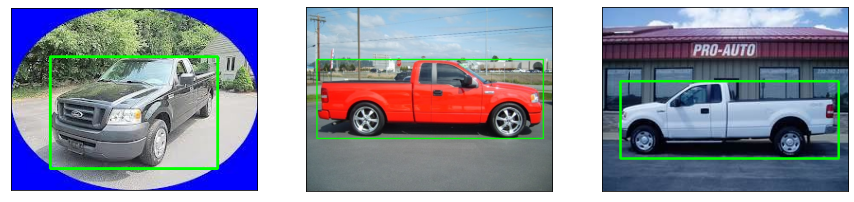

{}

In [34]:
plot_random_cars_with_bounding_box(car_makes_df, train_images_path, car_annotations_train)

#### Draw Bounding Box on Test Images

Ford Focus Sedan 2007


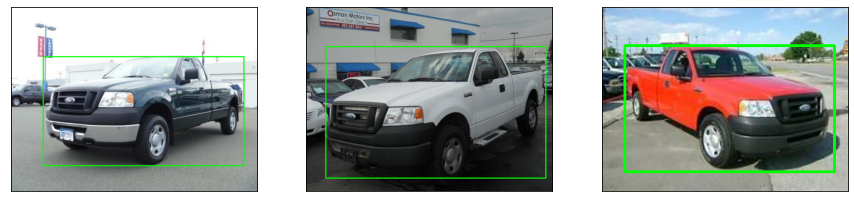

BMW 1 Series Convertible 2012


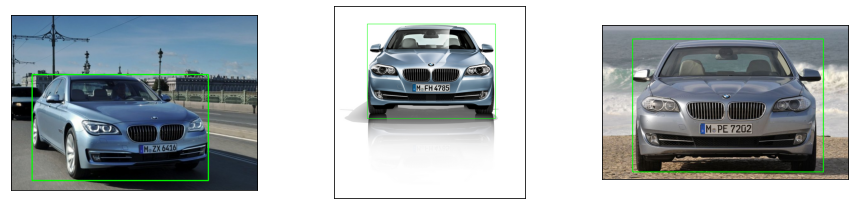

Porsche Panamera Sedan 2012


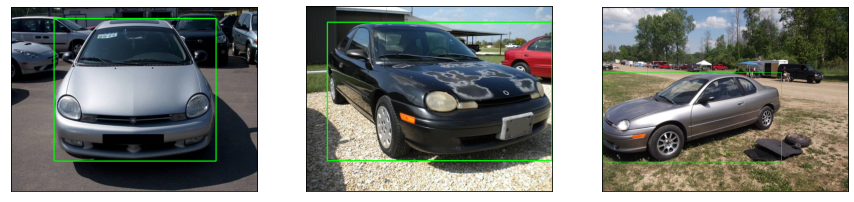

Suzuki SX4 Sedan 2012


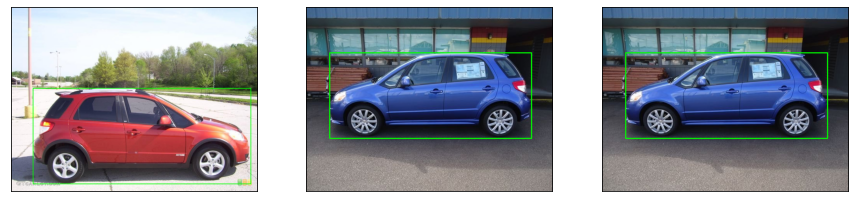

Dodge Charger SRT-8 2009


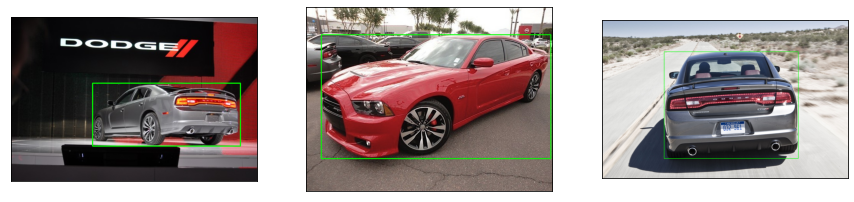

{}

In [35]:
plot_random_cars_with_bounding_box(car_makes_df, test_images_path,car_annotations_test)

####  Output: 
#### Images mapped to its class and annotation ready to be used for deep learning

### #Milestone 2

### Classification Model

In [36]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Flatten, Dropout
Image_Size = 224
Batch_Size = 32
Epochs = 10

#### Define Callbacks

In [37]:
from tensorflow.keras.callbacks import LearningRateScheduler, ReduceLROnPlateau, ModelCheckpoint

#model checkpoint to save the model after every epoch
SavePath = "models/ResNetModel_weights.{epoch:02d}.hdf5"
model_checkpoint = ModelCheckpoint(
    filepath=SavePath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='auto')

lr_schedule = LearningRateScheduler(lambda epoch: 1e-8 * 10**(epoch/2)) # change learning rate from 1e-8 to 1e-3

Redlr = ReduceLROnPlateau(
    monitor='val_loss', factor=0.1, patience=5, verbose=0,
    mode='auto', min_delta=0.0001, cooldown=0, min_lr=0.00001)

### Data Generator w/o Augmentation

##### Load the image during training using flow from directory function

In [38]:
train_datagen = ImageDataGenerator(rescale=1.0/255)
test_datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(TRAIN_IMAGES_DIR_PATH, target_size = (Image_Size, Image_Size), batch_size=Batch_Size, class_mode='categorical')
test_generator = test_datagen.flow_from_directory(TEST_IMAGES_DIR_PATH, target_size = (Image_Size, Image_Size), batch_size=Batch_Size, class_mode='categorical')


Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


### MobileNet Model

In [39]:
from tensorflow.keras.applications.mobilenet import MobileNet

base_model = MobileNet(input_shape=(Image_Size, Image_Size, 3), include_top=False)

#Freeze all the layers
for layer in base_model.layers:
        layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x) #average pooling of the last feature extractor layer 
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dense(196, activation='softmax')(x) #Dense layer for 196 output class

model = Model(inputs=base_model.input, outputs=x)

model.summary()

2022-07-04 11:44:21.160724: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-07-04 11:44:21.161008: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


Metal device set to: Apple M1 Pro
Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                    

In [40]:
model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [41]:
model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=10, validation_data=test_generator, validation_steps=len(test_generator))

Epoch 1/10


2022-07-04 11:45:16.821337: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-07-04 11:45:17.488926: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - ETA: 0s - loss: 4.5091 - accuracy: 0.0621

2022-07-04 11:45:50.952572: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - 66s 253ms/step - loss: 4.5091 - accuracy: 0.0621 - val_loss: 3.5834 - val_accuracy: 0.1416
Epoch 2/10
255/255 [==============================] - 64s 251ms/step - loss: 2.9559 - accuracy: 0.2504 - val_loss: 2.7856 - val_accuracy: 0.2835
Epoch 3/10
255/255 [==============================] - 63s 249ms/step - loss: 2.1203 - accuracy: 0.4273 - val_loss: 2.4766 - val_accuracy: 0.3579
Epoch 4/10
255/255 [==============================] - 64s 251ms/step - loss: 1.5597 - accuracy: 0.5657 - val_loss: 2.2814 - val_accuracy: 0.3988
Epoch 5/10
255/255 [==============================] - 64s 251ms/step - loss: 1.1536 - accuracy: 0.6694 - val_loss: 2.1280 - val_accuracy: 0.4445
Epoch 6/10
255/255 [==============================] - 64s 251ms/step - loss: 0.8601 - accuracy: 0.7446 - val_loss: 2.2399 - val_accuracy: 0.4266
Epoch 7/10
255/255 [==============================] - 65s 253ms/step - loss: 0.5861 - accuracy: 0.8358 - val_loss: 2.1377 - val_accuracy: 0.4

Training accuracy of 95% and test accuracy of 47% is achieved.

The model is overfitting on the training data

### Data Generator with real time augmentation

In [42]:
# We will augment the image by applying shear, zoom & horizontal flip
train_datagen = ImageDataGenerator(rescale=1.0/255, shear_range=0.2, zoom_range=0.5, horizontal_flip=True)
test_datagen = ImageDataGenerator(rescale=1.0/255)

train_generator = train_datagen.flow_from_directory(TRAIN_IMAGES_DIR_PATH, target_size = (Image_Size, Image_Size), batch_size=32, class_mode='categorical')
test_generator = test_datagen.flow_from_directory(TEST_IMAGES_DIR_PATH, target_size = (Image_Size, Image_Size), batch_size=32, class_mode='categorical')

Found 8144 images belonging to 196 classes.
Found 8041 images belonging to 196 classes.


### MobileNet Model

In [43]:
from tensorflow.keras.applications.mobilenet import MobileNet

base_model = MobileNet(input_shape=(Image_Size, Image_Size, 3), include_top=False)

#Freeze all the layers
for layer in base_model.layers:
        layer.trainable = False

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dense(512, activation='relu')(x)
x = Dense(196, activation='softmax')(x)

MobileNet_model = Model(inputs=base_model.input, outputs=x)

MobileNet_model.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 conv1 (Conv2D)              (None, 112, 112, 32)      864       
                                                                 
 conv1_bn (BatchNormalizatio  (None, 112, 112, 32)     128       
 n)                                                              
                                                                 
 conv1_relu (ReLU)           (None, 112, 112, 32)      0         
                                                                 
 conv_dw_1 (DepthwiseConv2D)  (None, 112, 112, 32)     288       
                                                                 
 conv_dw_1_bn (BatchNormaliz  (None, 112, 112, 32)     128       
 ation)                                                    

In [44]:
MobileNet_model.compile(optimizer='Adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [45]:
history = MobileNet_model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=Epochs, validation_data=test_generator, validation_steps=len(test_generator))

Epoch 1/10


2022-07-04 12:00:43.418443: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - ETA: 0s - loss: 4.8790 - accuracy: 0.0290

2022-07-04 12:01:49.062911: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


255/255 [==============================] - 98s 380ms/step - loss: 4.8790 - accuracy: 0.0290 - val_loss: 3.9983 - val_accuracy: 0.0975
Epoch 2/10
255/255 [==============================] - 96s 376ms/step - loss: 3.6883 - accuracy: 0.1349 - val_loss: 3.2646 - val_accuracy: 0.1867
Epoch 3/10
255/255 [==============================] - 96s 378ms/step - loss: 3.0669 - accuracy: 0.2331 - val_loss: 2.9101 - val_accuracy: 0.2501
Epoch 4/10
255/255 [==============================] - 99s 390ms/step - loss: 2.6573 - accuracy: 0.3073 - val_loss: 2.5459 - val_accuracy: 0.3245
Epoch 5/10
255/255 [==============================] - 96s 379ms/step - loss: 2.3874 - accuracy: 0.3691 - val_loss: 2.4947 - val_accuracy: 0.3467
Epoch 6/10
255/255 [==============================] - 96s 378ms/step - loss: 2.1427 - accuracy: 0.4180 - val_loss: 2.2317 - val_accuracy: 0.3996
Epoch 7/10
255/255 [==============================] - 95s 372ms/step - loss: 1.9558 - accuracy: 0.4698 - val_loss: 2.2236 - val_accuracy: 0.4

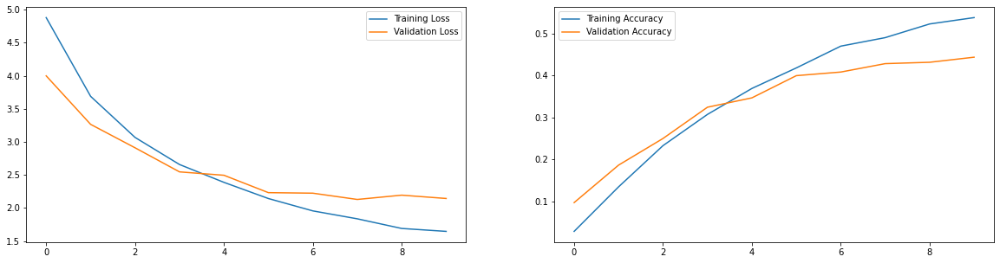

In [46]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()

#### The training and test accuracy are in sync, we are able to reduce overfitting by using data augmentation


In [47]:
#Save the model & weights for future reference
model_json = MobileNet_model.to_json()
with open("MobileNet_model.json", "w") as file:
  file.write(model_json)

MobileNet_model.save_weights("MobileNet_model_weights.h5")

Fitting the previous model for more epochs to train the network futher

In [48]:
history = MobileNet_model.fit(train_generator, steps_per_epoch=len(train_generator), epochs=10, validation_data=test_generator, validation_steps=len(test_generator))

Epoch 1/10
255/255 [==============================] - 96s 375ms/step - loss: 1.4987 - accuracy: 0.5767 - val_loss: 2.0286 - val_accuracy: 0.4563
Epoch 2/10
255/255 [==============================] - 95s 374ms/step - loss: 1.3935 - accuracy: 0.5969 - val_loss: 2.0642 - val_accuracy: 0.4692
Epoch 3/10
255/255 [==============================] - 96s 375ms/step - loss: 1.3180 - accuracy: 0.6207 - val_loss: 2.0845 - val_accuracy: 0.4570
Epoch 4/10
255/255 [==============================] - 95s 375ms/step - loss: 1.2612 - accuracy: 0.6370 - val_loss: 2.0285 - val_accuracy: 0.4762
Epoch 5/10
255/255 [==============================] - 96s 376ms/step - loss: 1.2133 - accuracy: 0.6454 - val_loss: 2.1009 - val_accuracy: 0.4726
Epoch 6/10
255/255 [==============================] - 96s 378ms/step - loss: 1.1636 - accuracy: 0.6573 - val_loss: 2.0679 - val_accuracy: 0.4831
Epoch 7/10
255/255 [==============================] - 99s 387ms/step - loss: 1.1024 - accuracy: 0.6729 - val_loss: 2.1800 - val_ac

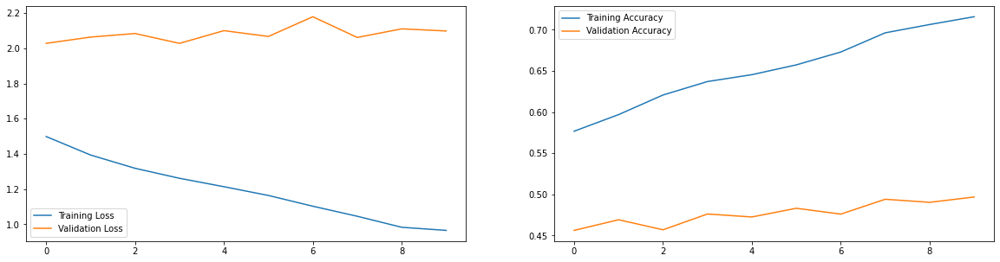

In [49]:
plt.figure(figsize=(20,5))
plt.subplot(1,2,1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()

plt.subplot(1,2,2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()

Training accuracy increased to 71% and test accuracy increased to almost 50%
There is no significant improvement in the test accuracy, the accuracy tends to saturate at 50%

In [1]:
import tensorflow as tf
import numpy as np
import os, pickle, re
import pandas as pd
import warnings
warnings.filterwarnings("ignore")
pd.set_option('display.max_columns', 50)

In [2]:
# import models to environment
from tensorflow.keras.optimizers import Adagrad,Adam,SGD,RMSprop
from tensorflow.keras import regularizers
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.resnet_v2 import ResNet152V2,ResNet50V2,ResNet101V2
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2B0,EfficientNetV2B1,EfficientNetV2B2,EfficientNetV2B3
from tensorflow.keras.applications.efficientnet_v2 import EfficientNetV2S,EfficientNetV2M,EfficientNetV2L
from tensorflow.keras.applications.densenet import DenseNet169,DenseNet201,DenseNet121
from tensorflow.keras.applications.nasnet import NASNetMobile

In [3]:
# list down parameters and the test ranges
optims = [Adam(), SGD(momentum=0.1)]

patiences = [4,8]
slopes = [0.3,0.5]
factors = [0.1,0.3]

uFreezePercents = [0,0.3,0.7]

learningRates = [1e-3,1e-7]
lossBalancing = [0.2,0.8]

dOuts = [0.5,0.7]
lmbdas = [0.1,0.01]

# create grid of parameters
pGrid = [{'optimizer':o,
          'patience':p,'slope':s,'factor':f,
          'unFreezeRatio':r,
          'learning_rate':lr,'lossBalance':lb,
          'dropOut':do,'lmbda':lmb}
         for o in optims
         for p in patiences for s in slopes for f in factors
         for r in uFreezePercents
         for lr in learningRates for lb in lossBalancing
         for do in dOuts for lmb in lmbdas
        ]
print("Parameter grid count: {:,d}".format(len(pGrid)))

Parameter grid count: 768


In [4]:
# define a transfer learning network mapped to our targets
def transferNET(application,input_size,dOut,lmbda):    
    
    import tensorflow as tf
    from tensorflow.keras.models import Model
    from tensorflow.keras.layers import Input,GlobalMaxPool2D,Dense,BatchNormalization,Dropout
    
     # Random consistency seed
    tf.random.set_seed(100)
    
    # load application
    tNet = application(input_shape=input_size[1:],include_top=False, weights='imagenet')
    
    # flatten with pooling
    pool = GlobalMaxPool2D(name="CustomLayerStart")(tNet.output)
    
    # classifier branch for car names
    nameBranch = Dense(512,activation='relu',kernel_regularizer=regularizers.l2(lmbda))(pool)
    Nbn1 = BatchNormalization()(nameBranch)
    Ndo1 = Dropout(dOut)(Nbn1)
    Nhid1 = Dense(256,activation='relu',kernel_regularizer=regularizers.l2(lmbda))(Ndo1)
    Nbn2 = BatchNormalization()(Nhid1)
    Ndo2 = Dropout(dOut)(Nbn2)
    classifier = Dense(196,activation='softmax',name="names")(Ndo2)
    
    # regression branch for bounding boxes
    boxBranch = Dense(64,activation='relu',kernel_regularizer=regularizers.l2(lmbda))(pool)
    Bbn1 = BatchNormalization()(boxBranch)
    Bdo1 = Dropout(dOut)(Bbn1)
    Bhid1 = Dense(32,activation='relu',kernel_regularizer=regularizers.l2(lmbda))(Bdo1)
    Bbn2 = BatchNormalization()(Bhid1)
    Bdo2 = Dropout(dOut)(Bbn2)
    bBox = Dense(4,activation='relu',name="boxes")(Bdo2)
    
    # assemble the network
    model = Model(inputs=tNet.inputs,outputs=[classifier,bBox])
    
    # freeze application layers and open classifer & regressor for training
    for layer in model.layers[:-15]:
        layer.trainable = False
    
    return model

In [8]:
models = [VGG16,VGG19,MobileNetV2,ResNet50V2,EfficientNetV2S,DenseNet201,NASNetMobile]
compareResults=pd.DataFrame()
for model in models:
    fname = os.path.join('deployables',model.__name__,"%s_attrib.gl"%model.__name__)
    with open(fname, 'rb') as fh:
        attributes = pickle.load(fh)
    """if compareResults.shape[0]==0:
        compareResults = pd.DataFrame(columns=list(attributes['evalResults'].keys()),dtype=object)"""
    
    compareResults = compareResults.append(attributes['evalResults'],ignore_index=True)
    
compareResults

,name,target_size,batch_size,optimizer,patience,slope,factor,learning_rate,lossWeights,epochs,verbose,logs,loss,names_loss,boxes_loss,names_CategoricalAccuracy,names_Precision,names_Recall,boxes_IoU,val_loss,val_names_loss,val_boxes_loss,val_names_CategoricalAccuracy,val_names_Precision,val_names_Recall,val_boxes_IoU,steps_per_epoch,validation_steps
0,VGG16,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [5.587075233459473, 3.966358661651611...",0.844168,0.831028,0.013140,0.859375,0.978552,0.656742,0.646943,2.857366,2.844716,0.012650,0.327067,0.650644,0.163471,0.651080,NaN,NaN
1,VGG19,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [5.638175010681152, 4.074068546295166...",0.952510,0.937004,0.015506,0.838091,0.980834,0.604454,0.618246,3.030715,3.015413,0.015301,0.303909,0.626506,0.135956,0.620036,NaN,NaN
2,MobileNetV2,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [5.118948459625244, 3.445307493209839...",0.452112,0.440491,0.011621,0.928765,0.982900,0.869833,0.650052,2.506006,2.494308,0.011697,0.389442,0.670391,0.224104,0.647654,NaN,NaN
3,ResNet50V2,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [5.000739574432373, 3.436673164367676...",0.369423,0.350934,0.018489,0.935778,0.981474,0.912525,0.587236,2.480897,2.462386,0.018511,0.408989,0.657504,0.259089,0.589307,NaN,NaN
4,EfficientNetV2S,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [5.972702503204346, 5.568402290344238...",4.983481,4.955740,0.027741,0.037032,0.000000,0.000000,0.511724,5.245408,5.218029,0.027380,0.016434,0.000000,0.000000,0.514779,NaN,NaN
5,DenseNet201,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",2,1,"{'loss': [5.747513771057129, 4.238009452819824...",3.653059,3.343921,0.309137,0.230315,0.659529,0.037894,0.004085,4.151174,3.840998,0.310175,0.139940,0.412234,0.019298,0.029028,100.0,10.0
6,NASNetMobile,"(224, 224)",32,Adam,15,0.15,0.1,0.001,"{'names': 0.5, 'boxes': 0.5}",30,1,"{'loss': [4.982983589172363, 3.866465091705322...",1.269307,1.258898,0.010408,0.728716,0.958167,0.414247,0.667567,2.815521,2.804810,0.010710,0.305154,0.639756,0.117405,0.665775,NaN,NaN


In [9]:
KPIs = compareResults[['name','loss','names_CategoricalAccuracy','boxes_IoU',
                                'val_loss','val_names_CategoricalAccuracy','val_boxes_IoU']]
KPIs.sort_values(by='val_names_CategoricalAccuracy',ascending=False)

,name,loss,names_CategoricalAccuracy,boxes_IoU,val_loss,val_names_CategoricalAccuracy,val_boxes_IoU
3,ResNet50V2,0.369423,0.935778,0.587236,2.480897,0.408989,0.589307
2,MobileNetV2,0.452112,0.928765,0.650052,2.506006,0.389442,0.647654
0,VGG16,0.844168,0.859375,0.646943,2.857366,0.327067,0.651080
6,NASNetMobile,1.269307,0.728716,0.667567,2.815521,0.305154,0.665775
1,VGG19,0.952510,0.838091,0.618246,3.030715,0.303909,0.620036
5,DenseNet201,3.653059,0.230315,0.004085,4.151174,0.139940,0.029028
4,EfficientNetV2S,4.983481,0.037032,0.511724,5.245408,0.016434,0.514779


In [5]:
from lib.networkPipe import Pipe

2022-07-31 14:00:48.023382: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-31 14:00:48.049584: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-31 14:00:48.049842: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:975] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-31 14:00:48.050442: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

In [12]:
logdir = "logs"
%load_ext tensorboard
%tensorboard --logdir logs

In [12]:
gIndex = np.arange(len(pGrid))
for index in np.random.choice(gIndex,30,replace=False):
    
    print("gridPosition used : %03d"%index)
    
    gPoint = pGrid[index]    
    # generator parameters
    gParams = dict(target_size=(224,224),batch_size=32)
    # model creation parameters
    mParams = dict(application=ResNet50V2,dOut=gPoint.get('dropOut'),lmbda=gPoint.get('lmbda'))
    # optimiser for compilation
    optim = gPoint.get('optimizer')
    # lr scheduler parameters
    lrParams = dict(patience=gPoint.get('patience'),slope=gPoint.get('slope'),factor=gPoint.get('factor'))
    # earlyStop parameters
    #eSparams = dict(patience=int(gPoint.get('patience')*3.1),slope=gPoint.get('slope')*0.5)
    eSparams = dict()
    # model fitting parameters
    fParams = dict(epochs=30,verbose=0,steps_per_epoch=50,validation_steps=10)
    # trainability scheduler parameters
    if gPoint.get('unFreezeRatio')==0:
        trParams = dict() 
    else:
        trParams = dict(uncontrolled=-15,schedule={int(gPoint.get('patience')*2.8):gPoint.get('unFreezeRatio')})
    # other hyper parameters
    lRate = gPoint.get('learning_rate')
    lBalance = gPoint.get('lossBalance')
    gridPoint = dict(learning_rate=lRate,lossWeights={'names':lBalance,'boxes':1-lBalance})
    
    pp = Pipe(generatorParams=gParams,modelFunc=transferNET,modelName="ResNet50V2_hTune_%03d"%index,modelParams=mParams)
    pp.compiler(optim=optim,lrScheduleParams=lrParams,eStopParams=eSparams,
                trainabilityParams=trParams,gridPoint=gridPoint,sBest=False)
    pp.fit(gridPoint=gridPoint,fitParams=fParams)
    pp.evaluate()
    pp.htuneSave()

gridPosition used : 489


imScanTest: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 196/196 [00:03<00:00, 53.40it/s]
2022-07-30 00:32:38.326589: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-07-30 00:32:40.018558: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 00:33:10.028114: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 487


2022-07-30 00:55:47.512971: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 00:56:16.839976: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 146


2022-07-30 01:19:09.548922: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 01:19:40.540491: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 672


2022-07-30 01:42:54.852345: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 01:43:24.809501: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 323


2022-07-30 02:06:30.394239: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 02:07:01.609770: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 758


2022-07-30 02:30:26.503942: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 02:30:56.733865: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 123


2022-07-30 02:53:57.342220: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 02:54:28.164741: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 643


2022-07-30 03:17:31.700605: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 03:18:02.071899: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 588


2022-07-30 03:41:00.600867: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 03:41:31.449377: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 097


2022-07-30 04:04:47.923868: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 04:05:17.612968: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 622


2022-07-30 04:28:41.150176: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 04:29:10.795849: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 132


2022-07-30 04:52:45.528712: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 04:53:16.602101: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 661


2022-07-30 05:16:41.133705: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 05:17:12.871830: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 689


2022-07-30 05:40:35.326024: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 05:41:06.266506: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 279


2022-07-30 06:04:17.981954: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 06:04:49.245426: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 750


2022-07-30 06:27:57.965199: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 06:28:28.111382: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 545


2022-07-30 06:51:36.246675: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 06:52:06.573275: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 516


2022-07-30 07:15:26.421792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 07:15:56.859499: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 164


2022-07-30 07:39:13.704803: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 07:39:45.410792: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 043


2022-07-30 08:03:14.665465: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 08:03:47.117854: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 280


2022-07-30 08:27:32.191586: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 08:28:02.864992: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 281


2022-07-30 08:51:45.417142: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 08:52:16.936634: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 717


2022-07-30 09:16:05.382913: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 09:16:37.109896: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 526


2022-07-30 09:40:09.228798: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 09:40:41.263332: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 755


2022-07-30 10:04:06.632067: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 10:04:37.544375: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 562


2022-07-30 10:28:08.456790: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 10:28:39.289292: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 539


2022-07-30 10:51:21.774174: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 10:51:52.093384: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 042


2022-07-30 11:14:39.770655: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 11:15:11.939027: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 582


2022-07-30 11:38:29.403042: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 11:39:00.873826: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


gridPosition used : 002


2022-07-30 12:02:11.071999: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-07-30 12:02:42.897864: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


In [12]:
dirList = os.listdir('./deployables/')
tuneList = [os.path.join('./deployables',fname) 
            for fname in dirList 
            if re.search(r'(hTune)',fname) 
            and re.search(r'(attrib.gl)',fname)]

In [13]:
tuneLog = pd.DataFrame()
for fname in tuneList:
    with open(fname, 'rb') as fh:
        attributes = pickle.load(fh)        
    tuneLog = tuneLog.append(attributes['evalResults'],ignore_index=True)

In [14]:
KPIs = tuneLog[['name','loss','names_CategoricalAccuracy','boxes_IoU',
                'val_loss','val_names_CategoricalAccuracy','val_boxes_IoU']]
KPIs.sort_values(by='val_names_CategoricalAccuracy',ascending=False)

,name,loss,names_CategoricalAccuracy,boxes_IoU,val_loss,val_names_CategoricalAccuracy,val_boxes_IoU
7,ResNet50V2_hTune_357,3.096646,0.516609,0.647384,3.713136,0.309512,0.648093
23,ResNet50V2_hTune_213,4.162242,0.515010,0.395893,4.792305,0.303909,0.399777
22,ResNet50V2_hTune_164,3.724387,0.362082,0.606193,4.090173,0.223481,0.609967
50,ResNet50V2_hTune_097,4.609859,0.317667,0.508563,4.932710,0.217505,0.512276
30,ResNet50V2_hTune_279,4.098151,0.301058,0.481427,4.343278,0.213770,0.482655
20,ResNet50V2_hTune_132,4.763387,0.244094,0.572507,4.990209,0.183391,0.576064
5,ResNet50V2_hTune_323,4.761096,0.245940,0.400854,4.944709,0.182271,0.404170
4,ResNet50V2_hTune_291,4.787927,0.240773,0.456392,4.985533,0.180777,0.465225
21,ResNet50V2_hTune_146,6.324769,0.252584,0.013193,6.519183,0.174801,0.012665
18,ResNet50V2_hTune_102,5.848691,0.136319,0.281144,5.945723,0.115289,0.289173


In [6]:
pGrid[357]

{'optimizer': <keras.optimizers.optimizer_v2.adam.Adam at 0x7f69582c7ee0>,
 'patience': 8,
 'slope': 0.5,
 'factor': 0.3,
 'unFreezeRatio': 0.3,
 'learning_rate': 0.001,
 'lossBalance': 0.8,
 'dropOut': 0.5,
 'lmbda': 0.01}

imScanTest: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 196/196 [00:03<00:00, 52.80it/s]


Epoch 1/40


2022-07-30 16:00:58.213178: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-07-30 16:00:59.958693: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


229/229 [==============================] - ETA: 0s - loss: 13.3685 - names_loss: 5.1055 - boxes_loss: 0.6026 - names_CategoricalAccuracy: 0.0424 - names_Precision: 0.2404 - names_Recall: 0.0034 - boxes_IoU: -0.0935

2022-07-30 16:03:12.492087: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


229/229 [==============================] - 151s 638ms/step - loss: 13.3685 - names_loss: 5.1055 - boxes_loss: 0.6026 - names_CategoricalAccuracy: 0.0424 - names_Precision: 0.2404 - names_Recall: 0.0034 - boxes_IoU: -0.0935 - val_loss: 9.4936 - val_names_loss: 4.2723 - val_boxes_loss: 0.2507 - val_names_CategoricalAccuracy: 0.0925 - val_names_Precision: 0.6667 - val_names_Recall: 0.0075 - val_boxes_IoU: 0.0758 - learning_rate: 0.0010 - Trainable: 15.0000 - lapTime: 151.0182
Epoch 2/40
229/229 [==============================] - 148s 648ms/step - loss: 8.0431 - names_loss: 4.0030 - boxes_loss: 0.2577 - names_CategoricalAccuracy: 0.1161 - names_Precision: 0.3875 - names_Recall: 0.0127 - boxes_IoU: 0.0533 - val_loss: 6.9119 - val_names_loss: 3.8428 - val_boxes_loss: 0.1362 - val_names_CategoricalAccuracy: 0.1212 - val_names_Precision: 0.4762 - val_names_Recall: 0.0125 - val_boxes_IoU: 0.2473 - learning_rate: 0.0010 - Trainable: 15.0000 - lapTime: 148.4243
Epoch 3/40
229/229 [===============

2022-07-30 18:07:20.438553: W tensorflow/python/util/util.cc:368] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.


INFO:tensorflow:Assets written to: ./deployables/ResNet50V2_FINAL/ResNet50V2_FINAL/tfsave/assets


,name,target_size,batch_size,optimizer,patience,slope,factor,uncontrolled,schedule,learning_rate,lossWeights,epochs,verbose,logs,loss,names_loss,boxes_loss,names_CategoricalAccuracy,names_Precision,names_Recall,boxes_IoU,val_loss,val_names_loss,val_boxes_loss,val_names_CategoricalAccuracy,val_names_Precision,val_names_Recall,val_boxes_IoU
0,ResNet50V2_FINAL,"(224, 224)",32,Adam,24,0.25,0.3,-15,{22: 0.3},0.001,"{'names': 0.8, 'boxes': 0.19999999999999996}",40,1,"{'loss': [13.368462562561035, 8.04307460784912...",1.248332,0.677075,0.006295,0.901575,0.981873,0.726378,0.719278,3.068458,2.496808,0.006688,0.373008,0.688816,0.183267,0.715414


2022-07-30 18:07:31.939469: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


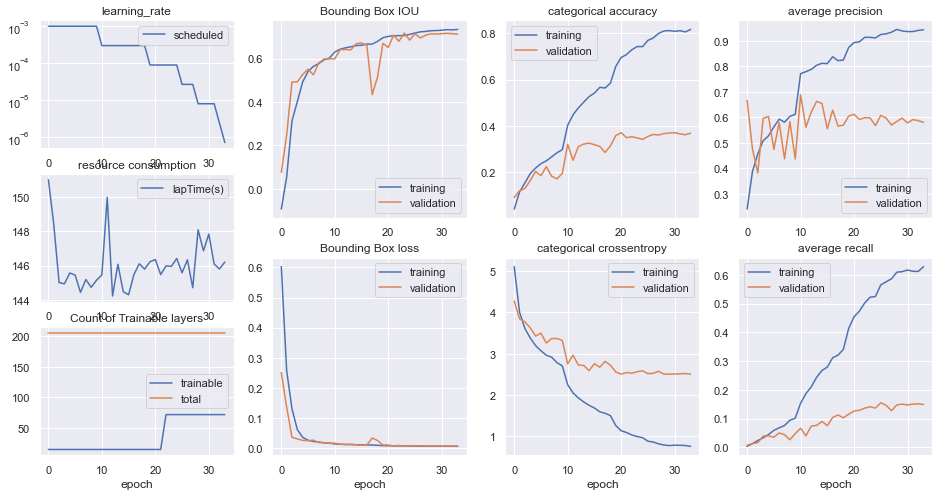

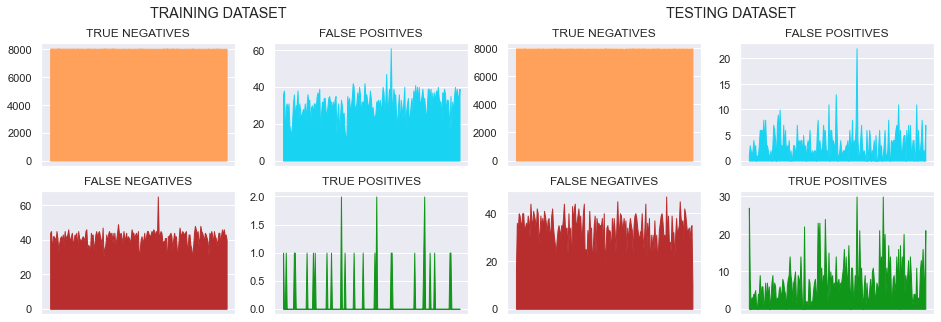

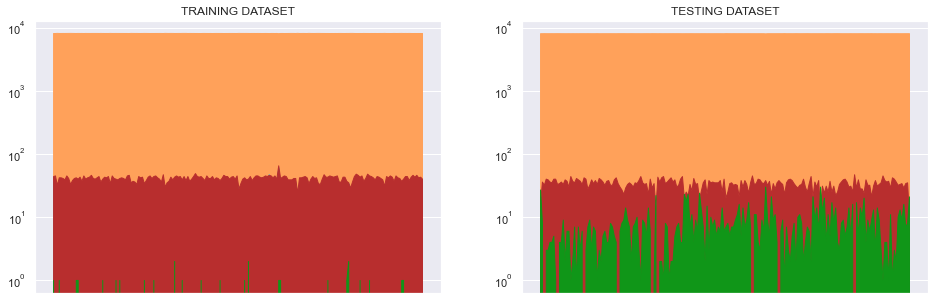

samples from TRAINING SET


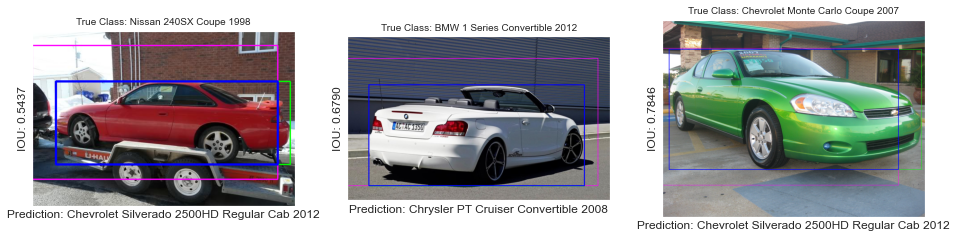

samples from TESTING SET


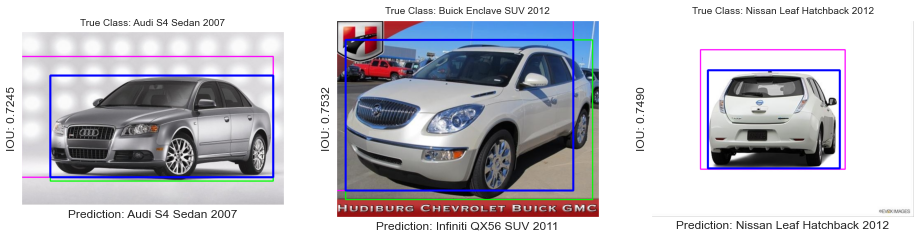

In [8]:
index=357

gPoint = pGrid[index]    
# generator parameters
gParams = dict(target_size=(224,224),batch_size=32)
# model creation parameters
mParams = dict(application=ResNet50V2,dOut=gPoint.get('dropOut'),lmbda=gPoint.get('lmbda'))
# optimiser for compilation
optim = gPoint.get('optimizer')
# lr scheduler parameters
lrParams = dict(patience=gPoint.get('patience'),slope=gPoint.get('slope'),factor=gPoint.get('factor'))
# earlyStop parameters
eSparams = dict(patience=int(gPoint.get('patience')*3.1),slope=gPoint.get('slope')*0.5)
# model fitting parameters
fParams = dict(epochs=40,verbose=1)
# trainability scheduler parameters
if gPoint.get('unFreezeRatio')==0:
    trParams = dict() 
else:
    trParams = dict(uncontrolled=-15,schedule={int(gPoint.get('patience')*2.8):gPoint.get('unFreezeRatio')})
# other hyper parameters
lRate = gPoint.get('learning_rate')
lBalance = gPoint.get('lossBalance')
gridPoint = dict(learning_rate=lRate,lossWeights={'names':lBalance,'boxes':1-lBalance})

pp = Pipe(generatorParams=gParams,modelFunc=transferNET,modelName="ResNet50V2_FINAL",modelParams=mParams)
pp.compiler(optim=optim,lrScheduleParams=lrParams,eStopParams=eSparams,
            trainabilityParams=trParams,gridPoint=gridPoint,sBest=False)
pp.fit(gridPoint=gridPoint,fitParams=fParams)
pp.evaluate()
pp.save()
pp.report()

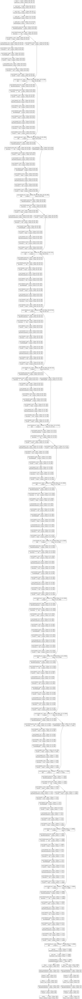

In [11]:
# visualise the final model in full topology
from tensorflow.keras.utils import plot_model
plot_model(pp.model,show_shapes=True,show_layer_activations=True,expand_nested=False)